# Table of Contents

* [Loading libraires and dataset](#chapter0)
* [Exploratory data analysis and Preprocessing](#chapter1)
* [Processing](#chapter2)
* [Hyperparameters optimization](#chapter3)
* [Results](#chapter4)
* [Feature Importance](#chapter5)
* [Data Drift](#chapter6)

# Loading libraires and dataset <a class="anchor" id='chapter0'></a>

In [118]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import fbeta_score, make_scorer
from sklearn.metrics import f1_score, roc_auc_score, accuracy_score, recall_score, precision_score
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_validate, cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline, make_pipeline

from imblearn.metrics import classification_report_imbalanced
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN

from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

from datetime import datetime

import pickle
import mlflow
import gc
gc.enable()

import optuna

from evidently.report import Report
from evidently.metrics import DataDriftTable
from evidently.metrics import DatasetDriftMetric

import shap

from yellowbrick.classifier.threshold import discrimination_threshold

In [2]:
df = pd.read_csv('/Users/jeaneudesdesgraviers/Downloads/df_full_features.csv')
df_data_drift = pd.read_csv('/Users/jeaneudesdesgraviers/Downloads/project_7/df_datadrift.csv')
df

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,100002,1,0,0,0,0,202500.0,406597.5,24700.5,351000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100003,0,1,0,1,0,270000.0,1293502.5,35698.5,1129500.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100004,0,0,1,0,0,67500.0,135000.0,6750.0,135000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100006,0,1,0,0,0,135000.0,312682.5,29686.5,297000.0,...,False,0.0,0.0,0.0,False,False,0.0,0.0,0.0,6.0
4,100007,0,0,0,0,0,121500.0,513000.0,21865.5,513000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307502,456251,0,0,0,1,0,157500.0,254700.0,27558.0,225000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307503,456252,0,1,0,0,0,72000.0,269550.0,12001.5,225000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307504,456253,0,1,0,0,0,153000.0,677664.0,29979.0,585000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307505,456254,1,1,0,0,0,171000.0,370107.0,20205.0,319500.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Exploratory data analysis and Preprocessing <a class="anchor" id='chapter1'></a>

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307507 entries, 0 to 307506
Columns: 797 entries, SK_ID_CURR to CC_COUNT
dtypes: bool(133), float64(605), int64(43), object(16)
memory usage: 1.6+ GB


<Axes: title={'center': 'Proportion de NaN par variable (%)'}, ylabel='None'>

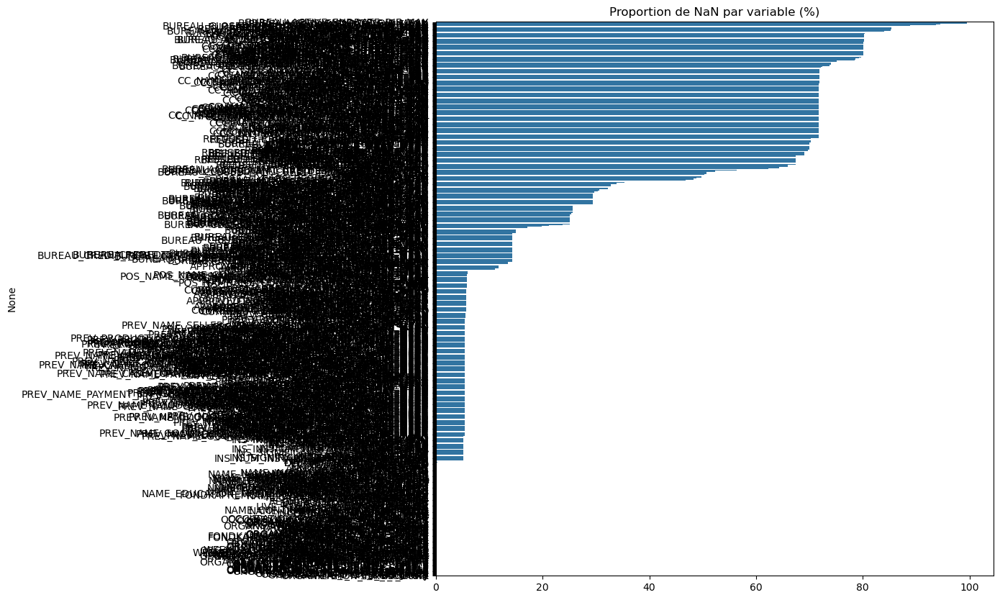

In [31]:
data_nan = df.isna().sum().sort_values(ascending=False)

plt.figure(figsize=(10, 10))
plt.title("Proportion de NaN par variable (%)")
sns.barplot(x=data_nan.values / df.shape[0] * 100, y=data_nan.index)

In [3]:
# Function to calculate missing values by column# Funct 
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [33]:
# Missing values statistics
missing_values = missing_values_table(df)
missing_values.head(20)

Your selected dataframe has 863 columns.
There are 701 columns that have missing values.


,Missing Values,% of Total Values
BUREAU_ACTIVE_ENDDATE_DIF_MEAN,306031,99.5
BUREAU_ACTIVE_ENDDATE_DIF_MAX,306031,99.5
BUREAU_ACTIVE_ENDDATE_DIF_MIN,306031,99.5
CC_PAYMENT_DIV_MIN_VAR,290839,94.6
CC_PAYMENT_DIV_MIN_MEAN,288181,93.7
BUREAU_CLOSED_CREDIT_TO_ANNUITY_RATIO_MEAN,273128,88.8
BUREAU_CREDIT_TO_ANNUITY_RATIO_MEAN,269832,87.7
REFUSED_RATE_DOWN_PAYMENT_MEAN,262339,85.3
REFUSED_DOWN_PAYMENT_TO_CREDIT_MEAN,262339,85.3
REFUSED_AMT_DOWN_PAYMENT_MEAN,262339,85.3


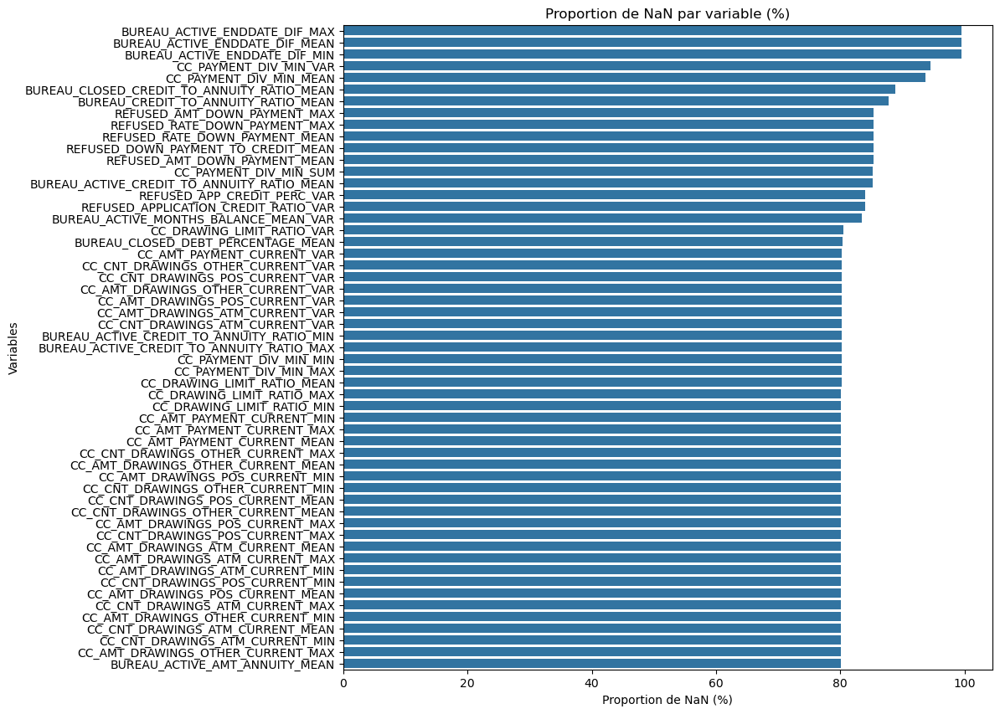

In [34]:
data_nan = df.isna().sum().sort_values(ascending=False)

# Filter variables with >= 80% missing values
threshold = 0.8  # You can adjust this threshold as needed
filtered_data_nan = data_nan[data_nan / df.shape[0] >= threshold]

if not filtered_data_nan.empty:
    plt.figure(figsize=(10, 10))
    plt.title("Proportion de NaN par variable (%)")
    sns.barplot(x=filtered_data_nan.values / df.shape[0] * 100, y=filtered_data_nan.index) 
    plt.xlabel("Proportion de NaN (%)")
    plt.ylabel("Variables")
    plt.show()
else:
    print("No variables with >= 80% missing values found.")

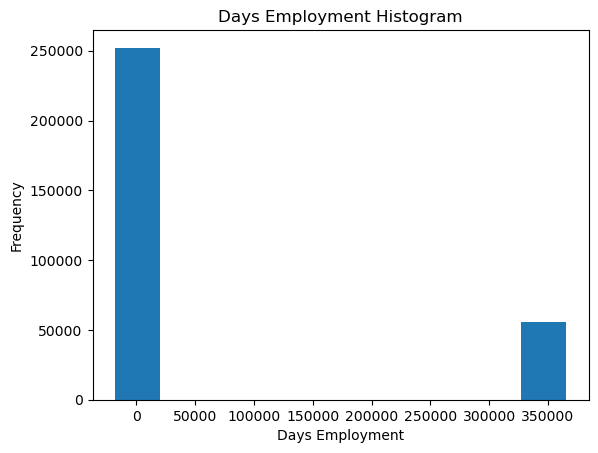

In [35]:
df['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

In [4]:
anom = df[df['DAYS_EMPLOYED'] == 365243]
non_anom = df[df['DAYS_EMPLOYED'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

The non-anomalies default on 8.07% of loans
The anomalies default on nan% of loans
There are 0 anomalous days of employment


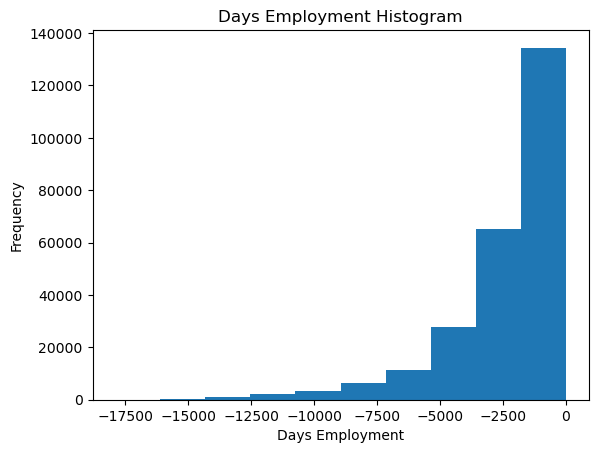

In [5]:
# Create an anomalous flag column
df['DAYS_EMPLOYED_ANOM'] = df["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
df['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

df['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

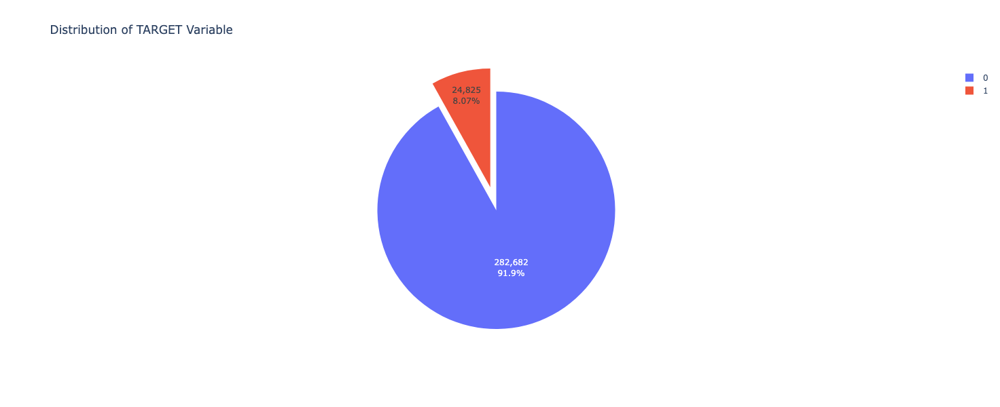

In [38]:
import plotly.graph_objects as go

# Assuming df is your DataFrame
labels = df['TARGET'].value_counts().index.tolist()
values = df['TARGET'].value_counts().values.tolist()

# pull is given as a fraction of the pie radius
fig = go.Figure(data=[go.Pie(labels=labels, values=values, pull=[0, 0.2],textinfo='value+percent')])
fig.update_layout(title_text='Distribution of TARGET Variable',    
                  height=600,  # Adjust the height of the chart
    width=800    # Adjust the width of the chart
                 )

# Show the plot
fig.show()

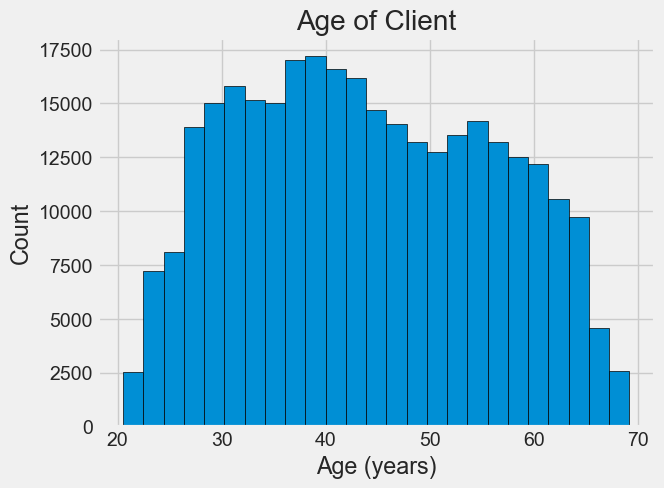

In [ ]:
# Set the style of plots
plt.style.use('fivethirtyeight')

# Plot the distribution of ages in years
plt.hist(df['DAYS_BIRTH'] / -365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

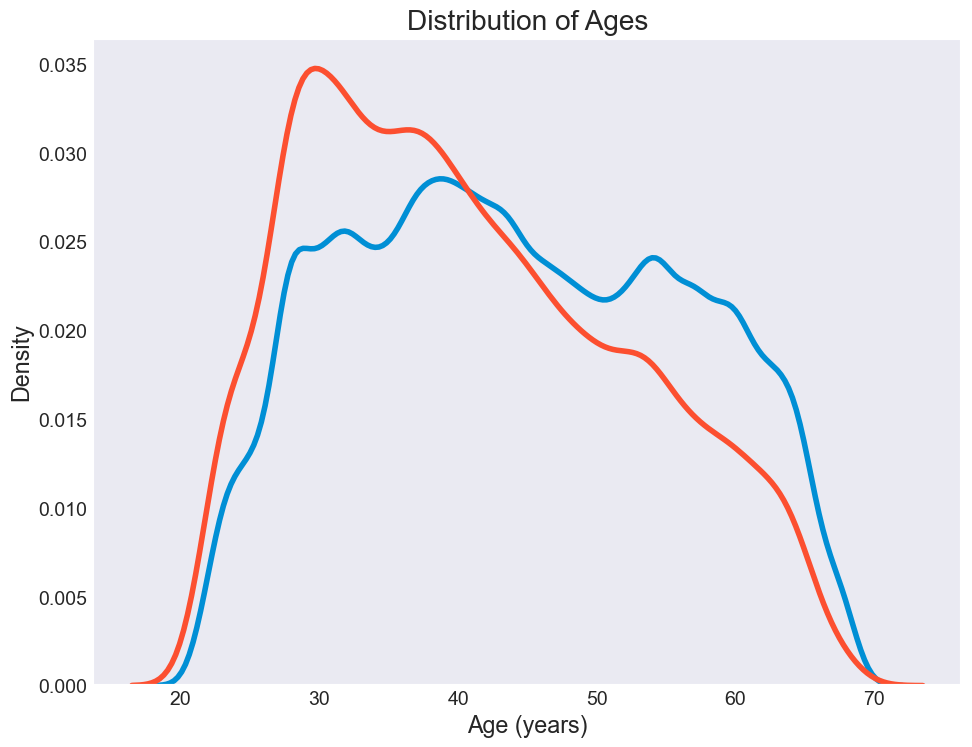

In [102]:
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(df.loc[df['TARGET'] == 0, 'DAYS_BIRTH'] / -365, label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(df.loc[df['TARGET'] == 1, 'DAYS_BIRTH'] / -365, label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');

/var/folders/gs/0bx6d0ms3jxfgjd6vfkz22l40000gn/T/ipykernel_8378/3048939138.py:10: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



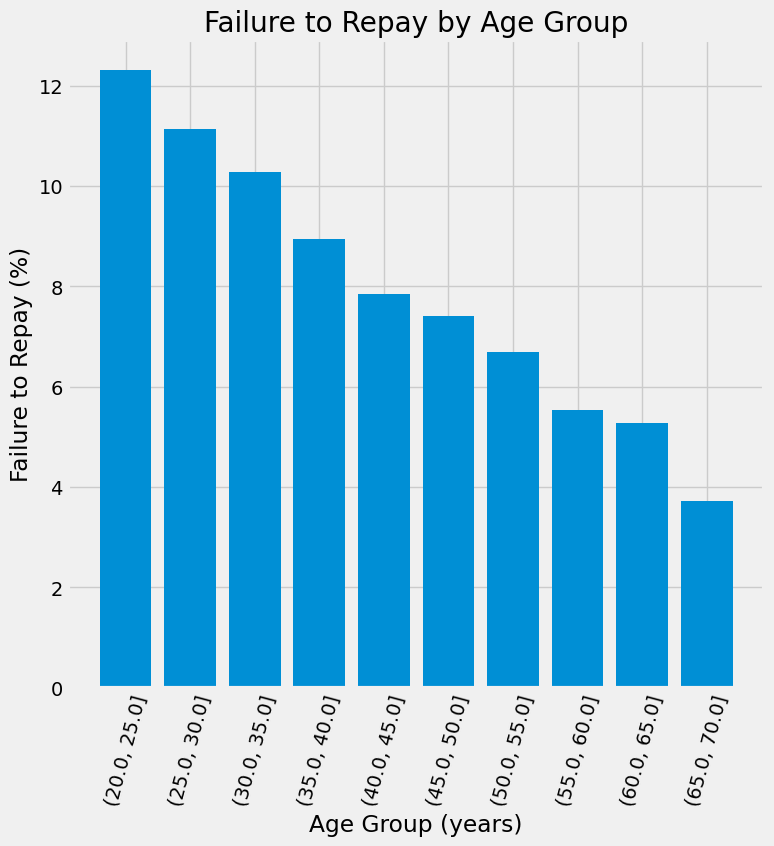

In [41]:
# Age information into a separate dataframe
age_data = df[['TARGET', 'DAYS_BIRTH']].copy()
age_data['YEARS_BIRTH'] = age_data['DAYS_BIRTH'] / -365

# Bin the age data
age_data['YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

# Group by the bin and calculate averages
age_groups  = age_data.groupby('YEARS_BINNED').mean()

plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group');

Modélisation

In [6]:
#We can't use gender category for modeeling as it is not ethical.
#Also we will drop the anom column that we created
df = df.drop(columns = ["DAYS_EMPLOYED_ANOM", "SK_ID_CURR", "CODE_GENDER"])

In [ ]:
# Find correlations with the target and sort
correlations = df_sampled.corr()['TARGET']
# correlations = app_train.drop('cashloans', 1).corr()['TARGET']

# Display correlations
print('*'*25,'Top10 positive correlations','*'*25)
display(correlations.sort_values(ascending=False).head(10))
print('*'*25,'Top10 negative correlations','*'*25)
display(correlations.sort_values().head(10))

************************* Top10 positive correlations *************************


TARGET                              1.000000
CC_LIMIT_USE_MEAN                   0.135903
CC_CNT_DRAWINGS_ATM_CURRENT_MEAN    0.107691
CC_CNT_DRAWINGS_CURRENT_MAX         0.101389
CC_LIMIT_USE_MIN                    0.101307
CC_LIMIT_USE_MAX                    0.097459
CC_DRAWING_LIMIT_RATIO_MEAN         0.090416
BUREAU_DAYS_CREDIT_MEAN             0.089730
CC_AMT_BALANCE_MEAN                 0.087177
CC_AMT_TOTAL_RECEIVABLE_MEAN        0.086490
Name: TARGET, dtype: float64

************************* Top10 negative correlations *************************


EXT_SOURCES_WEIGHTED              -0.230579
EXT_SOURCES_MEAN                  -0.222054
EXT_SOURCES_NANMEDIAN             -0.218120
EXT_SOURCES_MAX                   -0.196873
EXT_SOURCES_PROD                  -0.188557
EXT_SOURCES_MIN                   -0.185271
EXT_SOURCE_3                      -0.178926
EXT_SOURCE_2                      -0.160470
EXT_SOURCE_1                      -0.155318
BUREAU_MONTHS_BALANCE_SIZE_MEAN   -0.080193
Name: TARGET, dtype: float64

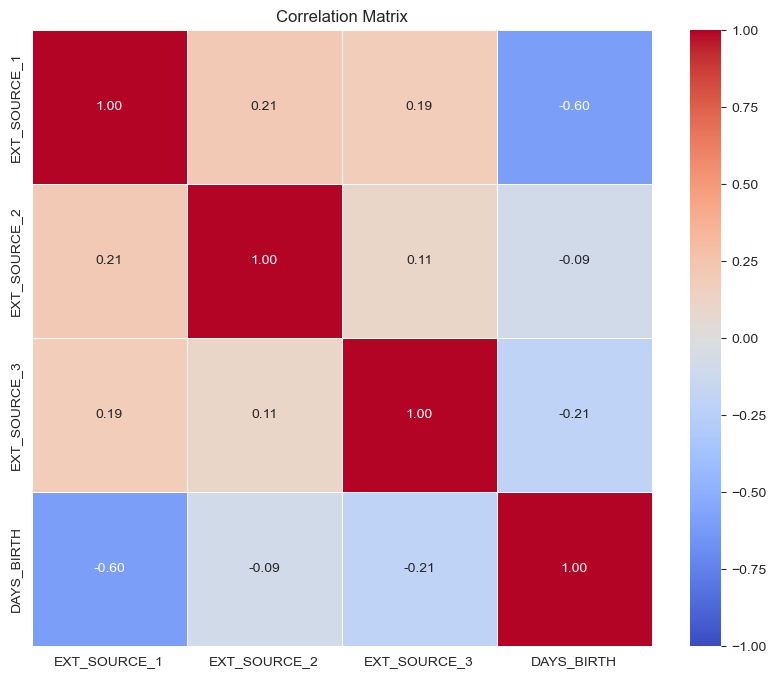

In [73]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a dataframe of the features
poly_features = df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]

# Calculate the correlation matrix
correlation_matrix = poly_features.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f", vmin=-1, vmax=1, linewidths=.5)

plt.title('Correlation Matrix')
plt.show()


# Processing <a class="anchor" id='chapter2'></a>

In [4]:
#Creating Processing functions

def preprocess_pipeline(X_train, X_eval, y_train, y_eval, model, params = None):
    
    SK_ID_CURR_train = X_train['SK_ID_CURR']
    SK_ID_CURR_eval = X_eval['SK_ID_CURR']
    
    SK_ID_CURR_df_train = pd.DataFrame(SK_ID_CURR_train, columns=['SK_ID_CURR']).reset_index().drop(columns='index')
    SK_ID_CURR_df_eval = pd.DataFrame(SK_ID_CURR_eval, columns=['SK_ID_CURR']).reset_index().drop(columns='index')
    
    # Define the features by dropping unnecessary columns
    features_train = X_train.drop(columns=['SK_ID_CURR', 'TARGET'])
    features_eval = X_eval.drop(columns=['SK_ID_CURR'])
    
    #params = {'class_weight': 'balanced', 'n_estimators': 384, 'max_depth': 5, 'learning_rate': 0.04543142022475362}

    model = model(random_state=42)
    
    ADA_015 = ADASYN(random_state=42)
    
    # Define the preprocessing steps
    numeric_features = features_train.select_dtypes(include=['int64', 'float64'])
    categorical_features = features_train.select_dtypes(include=['object'])

    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])
    
    categorical_transformer = Pipeline(steps=[
        ('onehot', OneHotEncoder(handle_unknown='ignore'))
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features.columns),
            ('cat', categorical_transformer, categorical_features.columns)
        ])
    
    pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('adasyn', ADA_015),
        ('model', model)
    ])
        
        # Fit the pipeline
    model = pipeline.fit(features_train, y_train)
        # Transform the original data using the fitted pipeline
    transformed_train = pipeline.named_steps['preprocessor'].transform(features_train)

        # Extract the transformed data from the final step of the pipeline
    transformed_eval = pipeline.named_steps['preprocessor'].transform(features_eval)

        # Get the column names for the transformed data (if available)
    column_names = []
    if hasattr(pipeline.named_steps['preprocessor'].named_transformers_['cat'], 'get_feature_names_out'):
        column_names = pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(input_features=categorical_features.columns)
    else:
            # If get_feature_names_out is not available, use the original column names
        column_names = categorical_features.columns

        # Create a new DataFrame with the transformed data and column names
    preprocessed_df_train = pd.DataFrame(transformed_train, columns=numeric_features.columns.tolist() + column_names.tolist())
    preprocessed_df_eval = pd.DataFrame(transformed_eval, columns=numeric_features.columns.tolist() + column_names.tolist())

    merged_data_train = pd.concat([SK_ID_CURR_df_train, preprocessed_df_train], axis=1)
    merged_data_eval = pd.concat([SK_ID_CURR_df_eval, preprocessed_df_eval], axis=1)

    return model, preprocessed_df_train, preprocessed_df_eval, merged_data_train, merged_data_eval

In [5]:
def model_results(model, X_train, y_train, X_eval, y_eval):
    
    "Affiche la matrice de confusion ainsi que le rappport de classification"
        
    sns.set_style("dark")
    
    start = datetime.now()
    
    #model.named_steps['preprocessor'].transform(X_train, y_train)
    train_preds = model.predict(X_train)
    eval_preds = model.predict(X_eval)
    
    #ROC requires probabilities
    train_pred_proba = model.predict_proba(X_train)[:, 1]
    eval_pred_proba = model.predict_proba(X_eval)[:, 1]
    
    end = datetime.now()
    
    predictions = model.predict(X_eval)
    cm = confusion_matrix(y_eval, predictions, labels=model.classes_)
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ['{0:0.0f}'.format(value) for value in
                cm.flatten()]
    group_percentages = ['{0:.2%}'.format(value) for value in
                     cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm, annot=labels, fmt='', cmap='Blues')
        
    print("For training set: \n")
    print(classification_report_imbalanced(y_train, train_preds, target_names = ["Negative", "Positive"], digits = 3))
    print("Roc-Auc TRAIN Score: " , roc_auc_score(y_train, train_pred_proba).round(3))
    print("F_beta TRAIN Score: " , fbeta_score(y_train, train_preds, beta=10, average='macro').round(3))
 
    print("For test set: \n")
    print(classification_report_imbalanced(y_eval, eval_preds, target_names = ["Negative", "Positive"], digits = 3))    
    print("Roc-Auc TEST Score: " , roc_auc_score(y_eval, eval_pred_proba).round(3))
    print("F_beta TEST Score: " , fbeta_score(y_eval, eval_preds, beta=10, average='macro').round(3))
    
    print("Total seconds: ",(end-start).total_seconds())

In [6]:
from imblearn.pipeline import Pipeline

def create_pipeline(model, train_features, sampling_method=None):
    
    preprocessor = ColumnTransformer(
        transformers=[
            ('cleaning', make_pipeline(SimpleImputer(strategy='median'), MinMaxScaler()), train_features.columns),
        ])
    
    if sampling_method:      
        pipeline = ImbPipeline([
            ('preprocess', preprocessor),
            ('Sampling', sampling_method),
            ('model', model)
        ])
    else:
        pipeline = ImbPipeline([
            ('num', preprocessor),
            ('model', model)
        ])
    
    return pipeline

In [7]:
def create_pipeline_encoding(model):
    
    numeric_features = X_train.select_dtypes(include=['int64', 'float64'])
    categorical_features = X_train.select_dtypes(include=['object'])

    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])
    
    categorical_transformer = Pipeline(steps=[
        ('onehot', OneHotEncoder(handle_unknown='ignore'))
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features.columns),
            ('cat', categorical_transformer, categorical_features.columns)
        ])
    
    pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('model', model)
    ])
    return pipeline

In [107]:
def ml_run(model, hp, run_name, train_features, test_features, name_pipeline, balancing_method, sampling_method = None):
        
    pipeline = create_pipeline(model, train_features, sampling_method)
    
    with mlflow.start_run(run_name=run_name):
                
        params = hp

        mlflow.set_tag("model_name", name_pipeline)
        mlflow.log_params(hp)
        mlflow.log_param("sampling_method", str(sampling_method))
        
        # Set hyperparameters for the model inside the pipeline
        pipeline['model'].set_params(**hp)
      
        start = datetime.now()

        pipeline.fit(train_features, y_train)
        model_preds = pipeline.predict(test_features)
        
        train_pred_proba = pipeline.predict_proba(train_features)[:, 1]
        test_pred_proba = pipeline.predict_proba(test_features)[:, 1]
        
        end = datetime.now()
        
        roc_auc_train = roc_auc_score(y_train, train_pred_proba)
        roc_auc = roc_auc_score(y_test, test_pred_proba)
        f_beta = fbeta_score(y_test, model_preds, beta=10, average='macro')
        accuracy = accuracy_score(y_test, model_preds)
        training_time = (end-start).total_seconds()

        mlflow.log_metric("test_roc_auc", roc_auc)
        mlflow.log_metric("test_accuracy", accuracy)
        mlflow.log_metric("test_f_beta", f_beta)
        mlflow.log_metric("training_time", training_time)
        
        model_results(pipeline, train_features, y_train, test_features, y_test)

        mlflow.sklearn.log_model(pipeline, "sk_models")
        
        return name_pipeline, balancing_method, str(sampling_method), roc_auc_train, roc_auc, f_beta, accuracy, training_time

In [96]:
def plot_shap_values(X_train,y_train, input_id = None):
    # plot the feature importance
    
    X_train = X_train.drop(columns = 'SK_ID_CURR')
    model = LogisticRegression()
    model.fit(X_train,y_train)

    selected_data = X_scaled_df.loc[X_scaled_df['SK_ID_CURR'] == input_id]
    selected_data = selected_data.drop(columns=['SK_ID_CURR'])
    categorical_features = selected_data.select_dtypes(include=['object'])

    #explainer_water = shap.Explainer(model, X_train)
    explainer_summary = shap.Explainer(model, X_train, feature_names=X_train.columns)

    # Create a new DataFrame with the transformed data and column names
    preprocessed_row = pd.DataFrame(selected_data, columns=X_train.columns)
    shap_values_water = explainer_summary(preprocessed_row)
    
    shap_values = explainer_summary(X_train)

    shap_values_summary = explainer_summary.shap_values(X_train)

    shap.plots.bar(shap_values)
    shap.summary_plot(shap_values_summary, X_train, feature_names = X_train.columns)
    shap.plots.waterfall(shap_values_water[0], max_display=10)
    return shap_values

In [15]:
results = pd.DataFrame(columns=["Model", "Balancing_method","Sampling_method","AUC", "AUC_test","F_beta_test","Accuracy_test","Time"])

In [42]:
mlflow.set_tracking_uri('http://ec2-35-180-32-40.eu-west-3.compute.amazonaws.com:5000/')

#mlflow.set_tracking_uri('http://127.0.0.1:5000')

### Logistic Regression

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.920     0.999     0.008     0.958     0.089     0.009    103415
   Positive      0.537     0.008     0.999     0.016     0.089     0.007      9085

avg / total      0.889     0.919     0.088     0.882     0.089     0.009    112500

Roc-Auc TRAIN Score:  0.733
F_beta TRAIN Score:  0.503
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.920     0.999     0.007     0.958     0.085     0.008     34472
   Positive      0.449     0.007     0.999     0.014     0.085     0.007      3028

avg / total      0.882     0.919     0.087     0.882     0.085     0.008     37500

Roc-Auc TEST Score:  0.731
F_beta TEST Score:  0.503
Total seconds:  0.092589


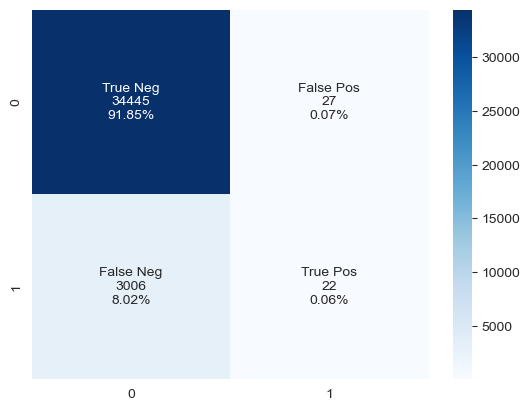

In [50]:
params = {"random_state": 42}
results.loc[len(results)] = ml_run(LogisticRegression(), params, "LR_baseline", X_train, X_test, name_pipeline="LR_baseline",balancing_method="None")

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.958     0.683     0.659     0.798     0.671     0.452    103415
   Positive      0.155     0.659     0.683     0.250     0.671     0.449      9085

avg / total      0.893     0.681     0.661     0.754     0.671     0.451    112500

Roc-Auc TRAIN Score:  0.733
F_beta TRAIN Score:  0.662
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.958     0.682     0.656     0.796     0.669     0.448     34472
   Positive      0.153     0.656     0.682     0.248     0.669     0.446      3028

avg / total      0.893     0.679     0.658     0.752     0.669     0.448     37500

Roc-Auc TEST Score:  0.732
F_beta TEST Score:  0.66
Total seconds:  0.102505


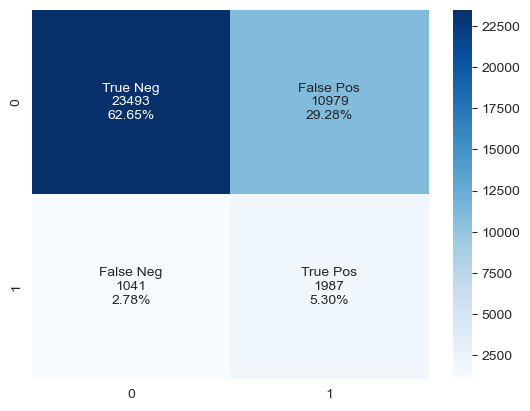

In [110]:
params = {"random_state": 42, "class_weight":"balanced"}
results.loc[len(results)] = results.loc[len(results)] = ml_run(LogisticRegression(), params, "LR_balanced", X_train, X_test, name_pipeline="LR_balanced",balancing_method="balanced_class_weight")

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.958     0.685     0.655     0.799     0.670     0.450    103415
   Positive      0.155     0.655     0.685     0.250     0.670     0.448      9085

avg / total      0.893     0.683     0.658     0.754     0.670     0.450    112500

Roc-Auc TRAIN Score:  0.733
F_beta TRAIN Score:  0.661
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.957     0.682     0.650     0.797     0.666     0.445     34472
   Positive      0.152     0.650     0.682     0.247     0.666     0.442      3028

avg / total      0.892     0.680     0.653     0.752     0.666     0.445     37500

Roc-Auc TEST Score:  0.731
F_beta TEST Score:  0.657
Total seconds:  0.107706


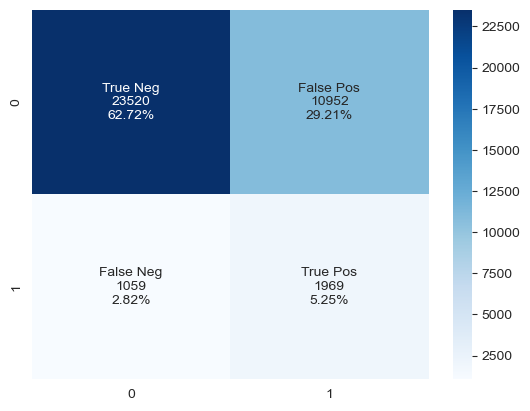

In [112]:
params = {"random_state": 42}
results.loc[len(results)] = ml_run(LogisticRegression(), params, "LR_UnderSampling", X_train, X_test, name_pipeline="LR_UnderSampling",balancing_method="Under_sampler",sampling_method=RandomUnderSampler())

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.958     0.683     0.657     0.797     0.670     0.450    103415
   Positive      0.154     0.657     0.683     0.249     0.670     0.448      9085

avg / total      0.893     0.681     0.659     0.753     0.670     0.450    112500

Roc-Auc TRAIN Score:  0.733
F_beta TRAIN Score:  0.661
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.958     0.682     0.657     0.797     0.669     0.449     34472
   Positive      0.154     0.657     0.682     0.249     0.669     0.447      3028

avg / total      0.893     0.680     0.659     0.753     0.669     0.449     37500

Roc-Auc TEST Score:  0.73
F_beta TEST Score:  0.66
Total seconds:  0.089573


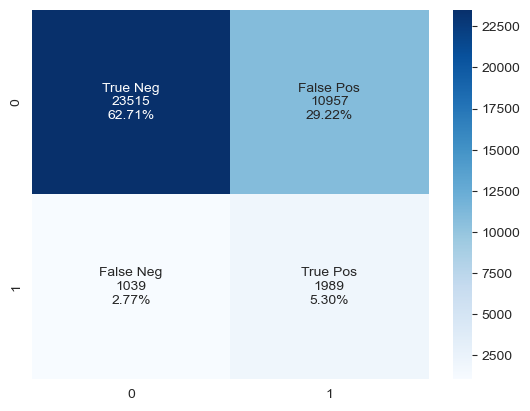

In [113]:
results.loc[len(results)] = ml_run(LogisticRegression(), params, "LR_SMOTE", X_train, X_test, name_pipeline="LR_SMOTE",balancing_method="SMOTE",sampling_method=SMOTE())

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.958     0.681     0.658     0.796     0.670     0.449    103415
   Positive      0.154     0.658     0.681     0.249     0.670     0.447      9085

avg / total      0.893     0.680     0.660     0.752     0.670     0.449    112500

Roc-Auc TRAIN Score:  0.733
F_beta TRAIN Score:  0.66
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.958     0.680     0.659     0.796     0.669     0.449     34472
   Positive      0.153     0.659     0.680     0.249     0.669     0.447      3028

avg / total      0.893     0.679     0.660     0.751     0.669     0.449     37500

Roc-Auc TEST Score:  0.73
F_beta TEST Score:  0.66
Total seconds:  0.088453


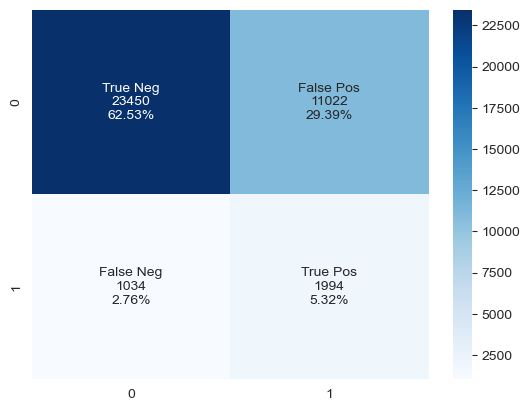

In [60]:
results.loc[len(results)] = ml_run(LogisticRegression(), params, "LR_SMOTE_not_majority", X_train, X_test, name_pipeline="LR_SMOTE_not_majority",balancing_method="SMOTE_NOT_MAJORITY",sampling_method=SMOTE(sampling_strategy = "not majority"))

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.959     0.668     0.672     0.787     0.670     0.449    103415
   Positive      0.151     0.672     0.668     0.247     0.670     0.449      9085

avg / total      0.893     0.668     0.672     0.744     0.670     0.449    112500

Roc-Auc TRAIN Score:  0.733
F_beta TRAIN Score:  0.66
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.959     0.667     0.672     0.787     0.670     0.448     34472
   Positive      0.151     0.672     0.667     0.246     0.670     0.449      3028

avg / total      0.893     0.668     0.672     0.743     0.670     0.448     37500

Roc-Auc TEST Score:  0.73
F_beta TEST Score:  0.659
Total seconds:  0.087877


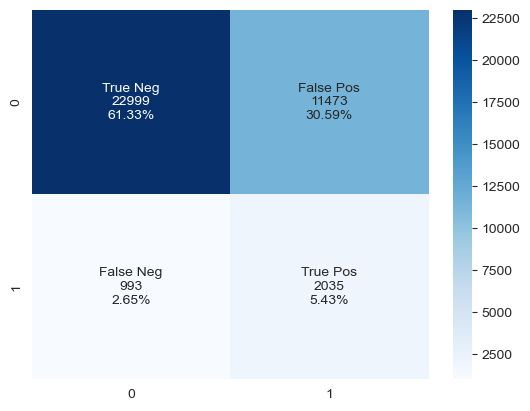

In [114]:
results.loc[len(results)] = ml_run(LogisticRegression(), params, "LR_ADASYN", X_train, X_test, name_pipeline="LR_ADASYN",balancing_method="ADASYN", sampling_method=ADASYN())

### Random Forest

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      1.000     1.000     1.000     1.000     1.000     1.000    103415
   Positive      1.000     1.000     1.000     1.000     1.000     1.000      9085

avg / total      1.000     1.000     1.000     1.000     1.000     1.000    112500

Roc-Auc TRAIN Score:  1.0
F_beta TRAIN Score:  1.0
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.920     0.999     0.010     0.958     0.098     0.011     34472
   Positive      0.433     0.010     0.999     0.019     0.098     0.009      3028

avg / total      0.881     0.919     0.089     0.882     0.098     0.010     37500

Roc-Auc TEST Score:  0.714
F_beta TEST Score:  0.504
Total seconds:  6.665351


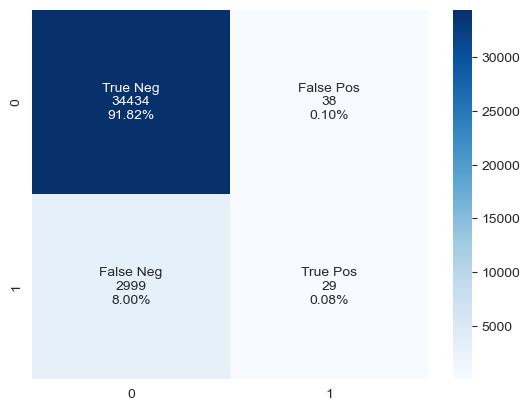

In [63]:
results.loc[len(results)] = ml_run(RandomForestClassifier(), params, "RandomForest", X_train, X_test, name_pipeline="RandomForest",balancing_method="None")

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      1.000     1.000     0.999     1.000     1.000     0.999    103415
   Positive      1.000     0.999     1.000     1.000     1.000     0.999      9085

avg / total      1.000     1.000     0.999     1.000     1.000     0.999    112500

Roc-Auc TRAIN Score:  1.0
F_beta TRAIN Score:  1.0
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.920     0.999     0.008     0.958     0.087     0.008     34472
   Positive      0.523     0.008     0.999     0.015     0.087     0.007      3028

avg / total      0.888     0.919     0.088     0.882     0.087     0.008     37500

Roc-Auc TEST Score:  0.719
F_beta TEST Score:  0.503
Total seconds:  6.969286


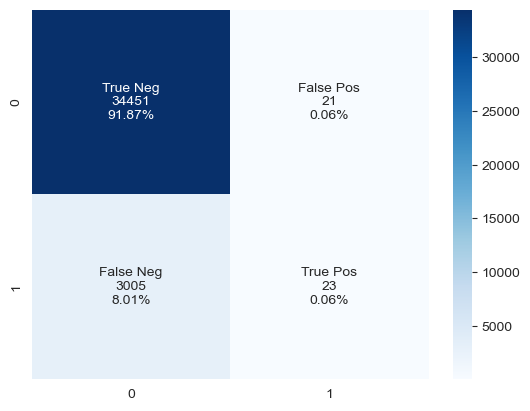

In [16]:
params = {"random_state": 42, "class_weight":"balanced"}

results.loc[len(results)] = ml_run(RandomForestClassifier(), params, "RandomForest_balanced", X_train, X_test, name_pipeline="RandomForest_balanced",balancing_method="balanced_class_weight")

### LGBM

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.921     0.999     0.029     0.959     0.170     0.032    103415
   Positive      0.804     0.029     0.999     0.056     0.170     0.026      9085

avg / total      0.912     0.921     0.107     0.886     0.170     0.031    112500

Roc-Auc TRAIN Score:  0.82
F_beta TRAIN Score:  0.514
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.920     0.999     0.016     0.958     0.124     0.017     34472
   Positive      0.485     0.016     0.999     0.030     0.124     0.014      3028

avg / total      0.885     0.919     0.095     0.883     0.124     0.017     37500

Roc-Auc TEST Score:  0.751
F_beta TEST Score:  0.507
Total seconds:  0.46689


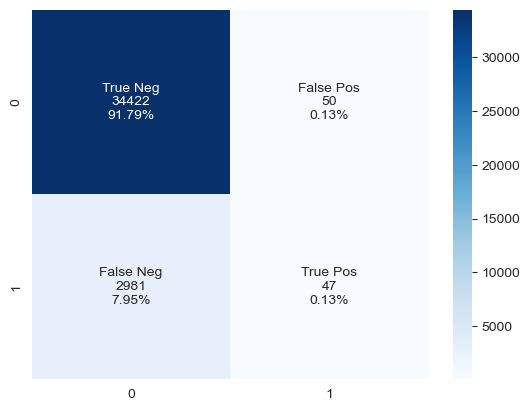

In [69]:
params = {"random_state": 42}

results.loc[len(results)] = results.loc[len(results)] = ml_run(LGBMClassifier(), params, "LGBM_classifier", X_train, X_test, name_pipeline="LGBM_classifier", balancing_method="None" )

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.969     0.731     0.734     0.833     0.732     0.536    103415
   Positive      0.193     0.734     0.731     0.306     0.732     0.537      9085

avg / total      0.906     0.731     0.734     0.791     0.732     0.536    112500

Roc-Auc TRAIN Score:  0.817
F_beta TRAIN Score:  0.723
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.959     0.724     0.651     0.825     0.686     0.474     34472
   Positive      0.171     0.651     0.724     0.271     0.686     0.467      3028

avg / total      0.896     0.718     0.657     0.780     0.686     0.474     37500

Roc-Auc TEST Score:  0.753
F_beta TEST Score:  0.679
Total seconds:  0.326136


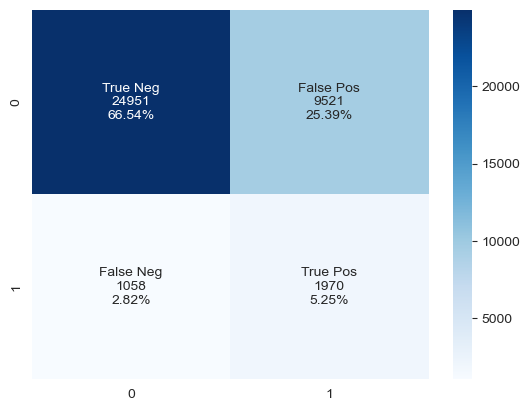

In [73]:
params = {"random_state": 42, "class_weight":"balanced"}

results.loc[len(results)] = ml_run(LGBMClassifier(), params, "LGBM_classifier_class_weight", X_train, X_test, name_pipeline="LGBM_classifier_class_weight", balancing_method="balanced_class_weight" )

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.969     0.702     0.747     0.814     0.724     0.522    103415
   Positive      0.180     0.747     0.702     0.291     0.724     0.526      9085

avg / total      0.906     0.706     0.743     0.772     0.724     0.522    112500

Roc-Auc TRAIN Score:  0.803
F_beta TRAIN Score:  0.714
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.960     0.693     0.669     0.805     0.681     0.465     34472
   Positive      0.161     0.669     0.693     0.259     0.681     0.463      3028

avg / total      0.895     0.691     0.671     0.761     0.681     0.465     37500

Roc-Auc TEST Score:  0.743
F_beta TEST Score:  0.672
Total seconds:  0.628829


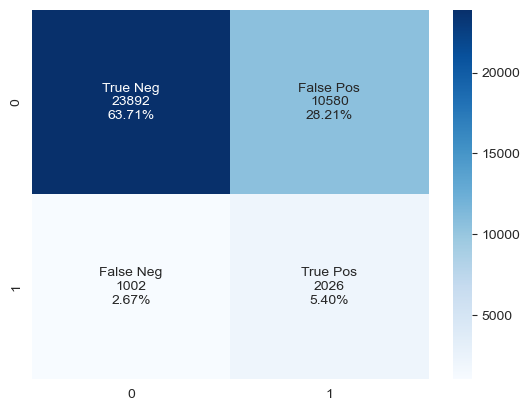

In [20]:
results.loc[len(results)] = ml_run(LGBMClassifier(), params, "LGBMClassifier_UnderSampling", X_train, X_test, name_pipeline="LGBMClassifier_UnderSampling",balancing_method="Under_sampler",sampling_method=RandomUnderSampler())

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.940     0.851     0.385     0.893     0.572     0.343    103415
   Positive      0.185     0.385     0.851     0.250     0.572     0.312      9085

avg / total      0.879     0.813     0.422     0.841     0.572     0.340    112500

Roc-Auc TRAIN Score:  0.712
F_beta TRAIN Score:  0.616
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.938     0.851     0.365     0.892     0.557     0.326     34472
   Positive      0.177     0.365     0.851     0.238     0.557     0.295      3028

avg / total      0.877     0.812     0.404     0.840     0.557     0.323     37500

Roc-Auc TEST Score:  0.702
F_beta TEST Score:  0.606
Total seconds:  0.417608


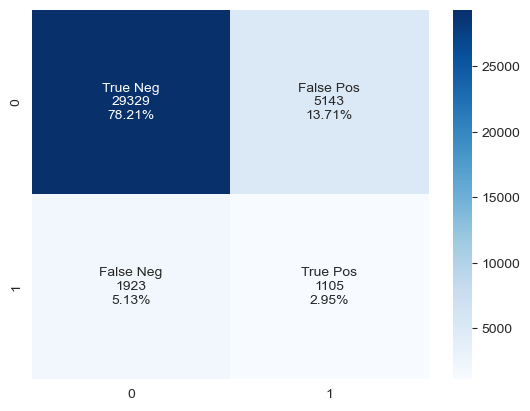

In [26]:
results.loc[len(results)] = ml_run(LGBMClassifier(), params, "LGBMClassifier_SMOTE", X_train, X_test, name_pipeline="LGBMClassifier_SMOTE",balancing_method="SMOTE",sampling_method=SMOTE())

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.939     0.851     0.374     0.893     0.564     0.334    103415
   Positive      0.181     0.374     0.851     0.244     0.564     0.303      9085

avg / total      0.878     0.813     0.413     0.841     0.564     0.331    112500

Roc-Auc TRAIN Score:  0.714
F_beta TRAIN Score:  0.611
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.938     0.850     0.361     0.892     0.554     0.322     34472
   Positive      0.174     0.361     0.850     0.235     0.554     0.292      3028

avg / total      0.876     0.810     0.400     0.839     0.554     0.319     37500

Roc-Auc TEST Score:  0.702
F_beta TEST Score:  0.604
Total seconds:  0.400317


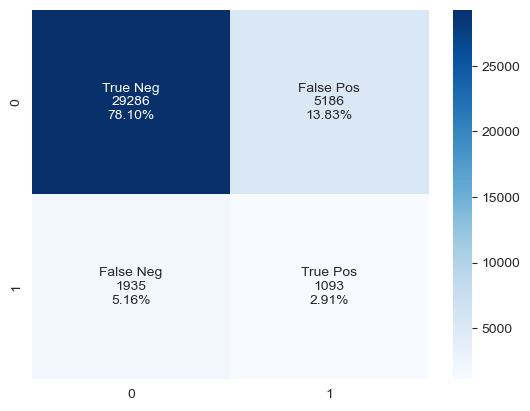

In [27]:
results.loc[len(results)] = ml_run(LGBMClassifier(), params, "LGBMClassifier_SMOTE_not_majority", X_train, X_test, name_pipeline="LGBMClassifier_SMOTE_not_majority",balancing_method="SMOTE_NOT_MAJORITY",sampling_method=SMOTE(sampling_strategy = "not majority"))

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.938     0.851     0.362     0.892     0.555     0.323    103415
   Positive      0.176     0.362     0.851     0.237     0.555     0.293      9085

avg / total      0.877     0.811     0.402     0.839     0.555     0.321    112500

Roc-Auc TRAIN Score:  0.705
F_beta TRAIN Score:  0.605
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.937     0.849     0.352     0.891     0.547     0.314     34472
   Positive      0.170     0.352     0.849     0.229     0.547     0.284      3028

avg / total      0.875     0.809     0.392     0.838     0.547     0.311     37500

Roc-Auc TEST Score:  0.695
F_beta TEST Score:  0.599
Total seconds:  0.39941


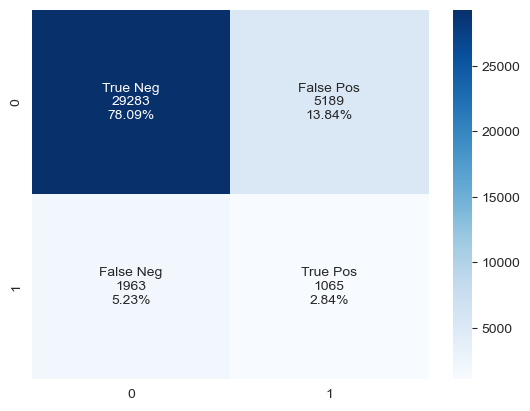

In [29]:
results.loc[len(results)] = ml_run(LGBMClassifier(), params, "LGBMClassifier_ADASYN", X_train, X_test, name_pipeline="LGBMClassifier_ADASYN",balancing_method="ADASYN", sampling_method=ADASYN())

### Catboost

Learning rate set to 0.077406
0:	learn: 0.6115497	total: 68.4ms	remaining: 1m 8s
1:	learn: 0.5444571	total: 80.7ms	remaining: 40.3s
2:	learn: 0.4903729	total: 93.6ms	remaining: 31.1s
3:	learn: 0.4472026	total: 104ms	remaining: 26s
4:	learn: 0.4127356	total: 115ms	remaining: 22.8s
5:	learn: 0.3853969	total: 126ms	remaining: 20.8s
6:	learn: 0.3622706	total: 137ms	remaining: 19.4s
7:	learn: 0.3434381	total: 146ms	remaining: 18.1s
8:	learn: 0.3286089	total: 157ms	remaining: 17.3s
9:	learn: 0.3168551	total: 168ms	remaining: 16.6s
10:	learn: 0.3069516	total: 178ms	remaining: 16s
11:	learn: 0.2984313	total: 189ms	remaining: 15.5s
12:	learn: 0.2915807	total: 198ms	remaining: 15s
13:	learn: 0.2857452	total: 206ms	remaining: 14.5s
14:	learn: 0.2806730	total: 215ms	remaining: 14.1s
15:	learn: 0.2766152	total: 225ms	remaining: 13.9s
16:	learn: 0.2731231	total: 235ms	remaining: 13.6s
17:	learn: 0.2702357	total: 244ms	remaining: 13.3s
18:	learn: 0.2676090	total: 253ms	remaining: 13s
19:	learn: 0.265

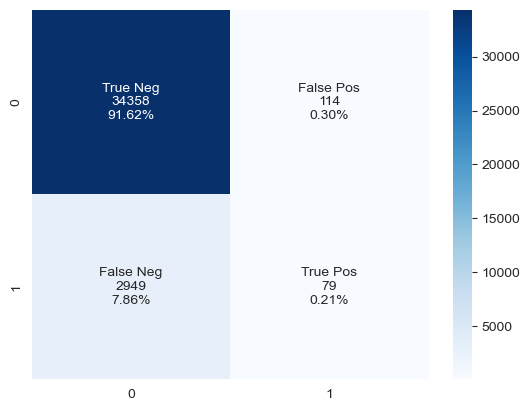

In [35]:
params = {"random_state": 42}

results.loc[len(results)] = ml_run(CatBoostClassifier(), params, "CatBoostClassifier", X_train, X_test, name_pipeline="CatBoostClassifier",balancing_method="None")

Learning rate set to 0.035537
0:	learn: 0.6880798	total: 6ms	remaining: 6s
1:	learn: 0.6833034	total: 10.7ms	remaining: 5.35s
2:	learn: 0.6788185	total: 16.8ms	remaining: 5.58s
3:	learn: 0.6747005	total: 21.7ms	remaining: 5.41s
4:	learn: 0.6708583	total: 27.2ms	remaining: 5.42s
5:	learn: 0.6674430	total: 31.3ms	remaining: 5.18s
6:	learn: 0.6639837	total: 35.6ms	remaining: 5.05s
7:	learn: 0.6611073	total: 40.2ms	remaining: 4.99s
8:	learn: 0.6579857	total: 44.2ms	remaining: 4.87s
9:	learn: 0.6550563	total: 48.3ms	remaining: 4.79s
10:	learn: 0.6524142	total: 53.2ms	remaining: 4.78s
11:	learn: 0.6497889	total: 57.9ms	remaining: 4.77s
12:	learn: 0.6472226	total: 62.1ms	remaining: 4.72s
13:	learn: 0.6452357	total: 67ms	remaining: 4.71s
14:	learn: 0.6431569	total: 71.3ms	remaining: 4.68s
15:	learn: 0.6411511	total: 76.3ms	remaining: 4.69s
16:	learn: 0.6392131	total: 84.3ms	remaining: 4.88s
17:	learn: 0.6373497	total: 90.6ms	remaining: 4.94s
18:	learn: 0.6357561	total: 96.1ms	remaining: 4.96s


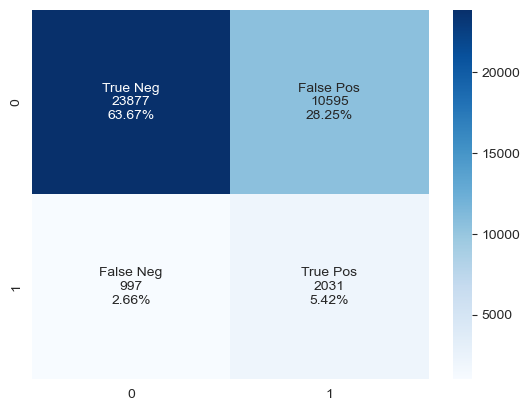

In [37]:
params = {"random_state": 42}
results.loc[len(results)] = ml_run(CatBoostClassifier(), params, "CatBoostClassifier_UnderSampling", X_train, X_test, name_pipeline="CatBoostClassifier_UnderSampling",balancing_method="Under_sampler",sampling_method=RandomUnderSampler())

Learning rate set to 0.100392
0:	learn: 0.6767665	total: 21.8ms	remaining: 21.8s
1:	learn: 0.6630041	total: 36.4ms	remaining: 18.2s
2:	learn: 0.6514103	total: 50.7ms	remaining: 16.8s
3:	learn: 0.6406848	total: 65.5ms	remaining: 16.3s
4:	learn: 0.6316344	total: 82.6ms	remaining: 16.4s
5:	learn: 0.6238748	total: 100ms	remaining: 16.6s
6:	learn: 0.6167072	total: 118ms	remaining: 16.8s
7:	learn: 0.6111303	total: 133ms	remaining: 16.5s
8:	learn: 0.6063465	total: 149ms	remaining: 16.4s
9:	learn: 0.6011495	total: 167ms	remaining: 16.5s
10:	learn: 0.5961747	total: 185ms	remaining: 16.7s
11:	learn: 0.5925428	total: 204ms	remaining: 16.8s
12:	learn: 0.5872679	total: 220ms	remaining: 16.7s
13:	learn: 0.5834057	total: 236ms	remaining: 16.6s
14:	learn: 0.5793775	total: 254ms	remaining: 16.7s
15:	learn: 0.5767354	total: 270ms	remaining: 16.6s
16:	learn: 0.5742971	total: 285ms	remaining: 16.5s
17:	learn: 0.5719307	total: 300ms	remaining: 16.3s
18:	learn: 0.5697201	total: 314ms	remaining: 16.2s
19:	le

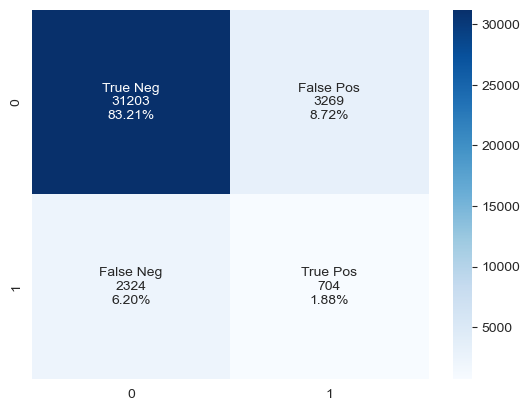

In [38]:
results.loc[len(results)] = ml_run(CatBoostClassifier(), params, "CatBoostClassifier_SMOTE", X_train, X_test, name_pipeline="CatBoostClassifier_SMOTE",balancing_method="SMOTE",sampling_method=SMOTE())

Learning rate set to 0.100392
0:	learn: 0.6767103	total: 15.1ms	remaining: 15.1s
1:	learn: 0.6620192	total: 28.2ms	remaining: 14.1s
2:	learn: 0.6502008	total: 41.8ms	remaining: 13.9s
3:	learn: 0.6398954	total: 55ms	remaining: 13.7s
4:	learn: 0.6308684	total: 67.1ms	remaining: 13.4s
5:	learn: 0.6229421	total: 79.4ms	remaining: 13.2s
6:	learn: 0.6163488	total: 92.9ms	remaining: 13.2s
7:	learn: 0.6100681	total: 107ms	remaining: 13.2s
8:	learn: 0.6045481	total: 120ms	remaining: 13.2s
9:	learn: 0.6000262	total: 133ms	remaining: 13.1s
10:	learn: 0.5948582	total: 146ms	remaining: 13.1s
11:	learn: 0.5913315	total: 160ms	remaining: 13.2s
12:	learn: 0.5880684	total: 175ms	remaining: 13.3s
13:	learn: 0.5846472	total: 191ms	remaining: 13.5s
14:	learn: 0.5807040	total: 208ms	remaining: 13.6s
15:	learn: 0.5759776	total: 224ms	remaining: 13.8s
16:	learn: 0.5738100	total: 239ms	remaining: 13.8s
17:	learn: 0.5712947	total: 253ms	remaining: 13.8s
18:	learn: 0.5691193	total: 269ms	remaining: 13.9s
19:	le

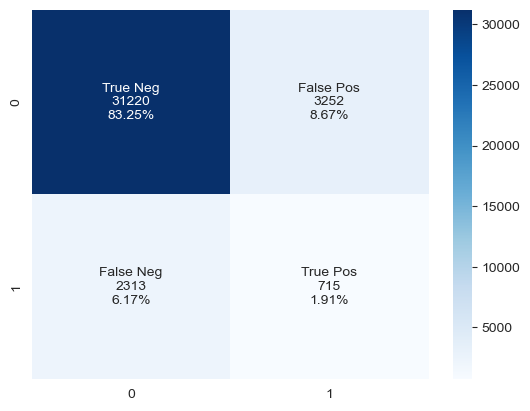

In [39]:
results.loc[len(results)] = ml_run(CatBoostClassifier(), params, "CatBoostClassifier_SMOTE_not_majority", X_train, X_test, name_pipeline="CatBoostClassifier_SMOTE_not_majority",balancing_method="SMOTE_NOT_MAJORITY",sampling_method=SMOTE(sampling_strategy = "not majority"))

Learning rate set to 0.100369
0:	learn: 0.6782710	total: 14.4ms	remaining: 14.4s
1:	learn: 0.6652430	total: 26.5ms	remaining: 13.2s
2:	learn: 0.6550801	total: 37.9ms	remaining: 12.6s
3:	learn: 0.6460243	total: 50.2ms	remaining: 12.5s
4:	learn: 0.6367028	total: 62.2ms	remaining: 12.4s
5:	learn: 0.6295258	total: 77.5ms	remaining: 12.8s
6:	learn: 0.6229174	total: 93ms	remaining: 13.2s
7:	learn: 0.6163276	total: 108ms	remaining: 13.3s
8:	learn: 0.6115906	total: 122ms	remaining: 13.4s
9:	learn: 0.6071730	total: 137ms	remaining: 13.5s
10:	learn: 0.6022158	total: 152ms	remaining: 13.7s
11:	learn: 0.5982077	total: 166ms	remaining: 13.6s
12:	learn: 0.5941030	total: 181ms	remaining: 13.8s
13:	learn: 0.5901763	total: 197ms	remaining: 13.9s
14:	learn: 0.5876005	total: 212ms	remaining: 13.9s
15:	learn: 0.5842912	total: 228ms	remaining: 14s
16:	learn: 0.5818104	total: 246ms	remaining: 14.2s
17:	learn: 0.5796278	total: 261ms	remaining: 14.3s
18:	learn: 0.5771948	total: 278ms	remaining: 14.3s
19:	lear

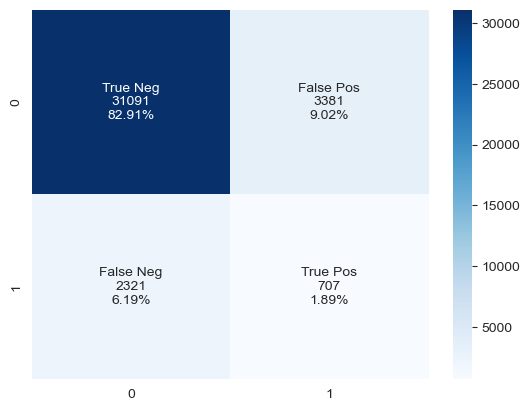

In [40]:
results.loc[len(results)] = ml_run(CatBoostClassifier(), params, "CatBoostClassifier_ADASYN", X_train, X_test, name_pipeline="CatBoostClassifier_ADASYN",balancing_method="ADASYN", sampling_method=ADASYN())

### XGboost

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.926     0.999     0.086     0.961     0.293     0.094    103415
   Positive      0.870     0.086     0.999     0.157     0.293     0.078      9085

avg / total      0.921     0.925     0.160     0.896     0.293     0.093    112500

Roc-Auc TRAIN Score:  0.869
F_beta TRAIN Score:  0.543
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.922     0.996     0.037     0.958     0.192     0.040     34472
   Positive      0.477     0.037     0.996     0.069     0.192     0.033      3028

avg / total      0.886     0.919     0.114     0.886     0.192     0.040     37500

Roc-Auc TEST Score:  0.745
F_beta TEST Score:  0.516
Total seconds:  0.175974


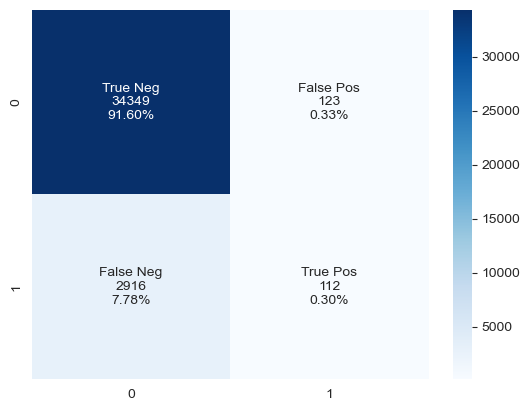

In [48]:
results.loc[len(results)] = ml_run(XGBClassifier(), params, "XGBClassifier", X_train, X_test, name_pipeline="XGBClassifier",balancing_method="None")

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.979     0.692     0.833     0.811     0.760     0.569    103415
   Positive      0.192     0.833     0.692     0.312     0.760     0.585      9085

avg / total      0.916     0.704     0.822     0.771     0.760     0.570    112500

Roc-Auc TRAIN Score:  0.841
F_beta TRAIN Score:  0.75
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.959     0.678     0.666     0.794     0.672     0.452     34472
   Positive      0.154     0.666     0.678     0.250     0.672     0.451      3028

avg / total      0.894     0.677     0.667     0.750     0.672     0.452     37500

Roc-Auc TEST Score:  0.732
F_beta TEST Score:  0.662
Total seconds:  0.188242


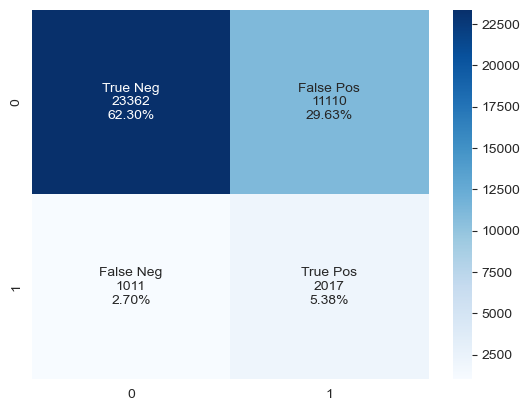

In [53]:
params = {"random_state": 42}
results.loc[len(results)] = ml_run(XGBClassifier(), params, "XGBClassifier_UnderSampling", X_train, X_test, name_pipeline="XGBClassifier_UnderSampling",balancing_method="Under_sampler",sampling_method=RandomUnderSampler())

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.938     0.928     0.297     0.933     0.525     0.293    103415
   Positive      0.265     0.297     0.928     0.280     0.525     0.258      9085

avg / total      0.883     0.877     0.348     0.880     0.525     0.290    112500

Roc-Auc TRAIN Score:  0.774
F_beta TRAIN Score:  0.612
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.932     0.919     0.239     0.925     0.469     0.235     34472
   Positive      0.206     0.239     0.919     0.221     0.469     0.205      3028

avg / total      0.874     0.864     0.294     0.869     0.469     0.232     37500

Roc-Auc TEST Score:  0.706
F_beta TEST Score:  0.579
Total seconds:  0.214058


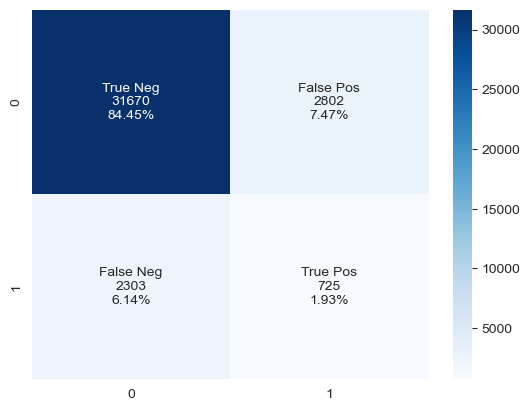

In [54]:
results.loc[len(results)] = ml_run(XGBClassifier(), params, "XGBClassifier_SMOTE", X_train, X_test, name_pipeline="XGBClassifier_SMOTE",balancing_method="SMOTE",sampling_method=SMOTE())

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.938     0.929     0.301     0.933     0.529     0.297    103415
   Positive      0.271     0.301     0.929     0.285     0.529     0.262      9085

avg / total      0.884     0.878     0.352     0.881     0.529     0.294    112500

Roc-Auc TRAIN Score:  0.774
F_beta TRAIN Score:  0.615
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.933     0.920     0.244     0.926     0.474     0.239     34472
   Positive      0.212     0.244     0.920     0.226     0.474     0.209      3028

avg / total      0.874     0.866     0.298     0.870     0.474     0.237     37500

Roc-Auc TEST Score:  0.707
F_beta TEST Score:  0.582
Total seconds:  0.254643


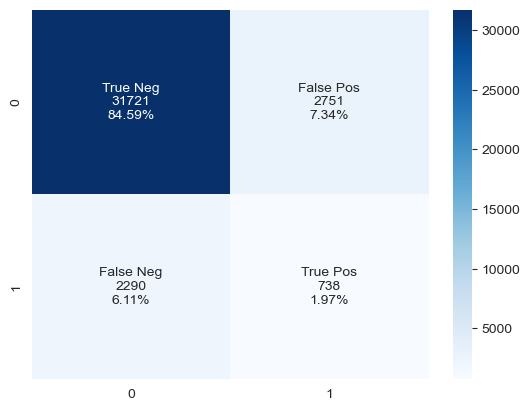

In [55]:
results.loc[len(results)] = ml_run(XGBClassifier(), params, "XGBClassifier_SMOTE_not_majority", X_train, X_test, name_pipeline="XGBClassifier_SMOTE_not_majority",balancing_method="SMOTE_NOT_MAJORITY",sampling_method=SMOTE(sampling_strategy = "not majority"))

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.936     0.931     0.275     0.933     0.506     0.273    103415
   Positive      0.259     0.275     0.931     0.267     0.506     0.240      9085

avg / total      0.881     0.878     0.328     0.880     0.506     0.270    112500

Roc-Auc TRAIN Score:  0.765
F_beta TRAIN Score:  0.603
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.930     0.921     0.210     0.925     0.439     0.207     34472
   Positive      0.188     0.210     0.921     0.198     0.439     0.179      3028

avg / total      0.870     0.863     0.267     0.867     0.439     0.205     37500

Roc-Auc TEST Score:  0.701
F_beta TEST Score:  0.565
Total seconds:  0.210355


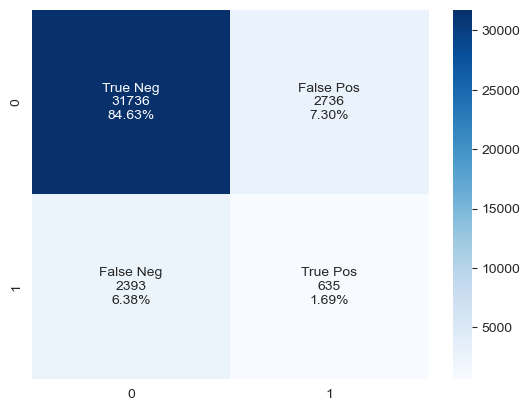

In [56]:
results.loc[len(results)] = ml_run(XGBClassifier(), params, "XGBClassifier_ADASYN", X_train, X_test, name_pipeline="XGBClassifier_ADASYN",balancing_method="ADASYN", sampling_method=ADASYN())

# Hyperparameters optimization <a class="anchor" id='chapter3'></a>

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.958     0.683     0.660     0.798     0.672     0.452    103415
   Positive      0.155     0.660     0.683     0.251     0.672     0.450      9085

avg / total      0.893     0.682     0.662     0.754     0.672     0.452    112500

Roc-Auc TRAIN Score:  0.734
F_beta TRAIN Score:  0.662
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.957     0.681     0.656     0.796     0.668     0.448     34472
   Positive      0.153     0.656     0.681     0.248     0.668     0.445      3028

avg / total      0.893     0.679     0.658     0.752     0.668     0.448     37500

Roc-Auc TEST Score:  0.732
F_beta TEST Score:  0.659
Total seconds:  0.096004
Best parameter (CV score=0.661):
{'C': 100, 'penalty': 'l2'}


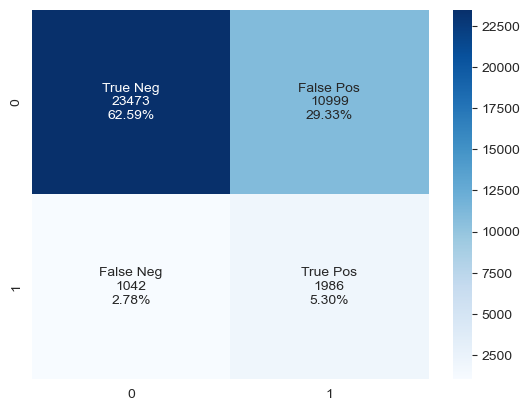

In [101]:
#Grid Search

lr_balanced = LogisticRegression(class_weight="balanced")
scoring_metric=make_scorer(fbeta_score, beta=10, average='macro')

params = {
    'penalty': ['l1', 'l2'],
    'C': [0.01, 0.1, 1, 2, 10, 100],
    }

gs_lr_balanced = GridSearchCV(
    lr_balanced,
    param_grid=params,
    scoring=scoring_metric,
    cv=5, 
    return_train_score = True,
    )

results.loc[len(results)] = ml_run(gs_lr_balanced, params, "LR_GS_balanced", X_train, X_test, name_pipeline="LR_GS_balanced", balancing_method="class_weight", sampling_method=None)
print("Best parameter (CV score=%0.3f):" % gs_lr_balanced.best_score_)
print(gs_lr_balanced.best_params_)

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.967     0.722     0.717     0.826     0.720     0.518    103415
   Positive      0.185     0.717     0.722     0.294     0.720     0.518      9085

avg / total      0.904     0.721     0.718     0.783     0.720     0.518    112500

Roc-Auc TRAIN Score:  0.799
F_beta TRAIN Score:  0.71
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.959     0.715     0.655     0.819     0.684     0.471     34472
   Positive      0.168     0.655     0.715     0.267     0.684     0.465      3028

avg / total      0.895     0.710     0.659     0.775     0.684     0.471     37500

Roc-Auc TEST Score:  0.751
F_beta TEST Score:  0.677
Total seconds:  0.512534
Best parameter (CV score=0.680):
{'learning_rate': 0.05, 'max_depth': -1, 'min_child_samples': 15, 'num_leaves': 40, 'reg_alpha': 0.03}


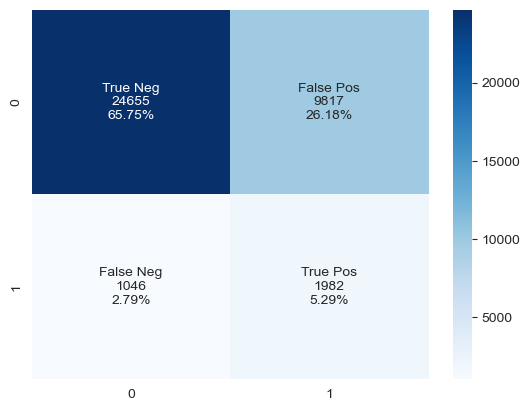

In [103]:
lGBM_balanced = LGBMClassifier(class_weight="balanced")

params = {
        'num_leaves':[20,40,60,80,100], 
        'min_child_samples':[5,10,15],
        'max_depth':[-1,5,10,20],
        'learning_rate':[0.05,0.1,0.2],
        'reg_alpha':[0,0.01,0.03]
         }

gs_LGBM_balanced = GridSearchCV(
    lGBM_balanced,
    param_grid=params,
    scoring=scoring_metric,
    cv=5, 
    return_train_score = True,
    )

results.loc[len(results)] = ml_run(gs_LGBM_balanced, params, "LGBM_balanced_GS", X_train, X_test, name_pipeline="LGBM_balanced_GS", balancing_method="class_weight", sampling_method=None)
print("Best parameter (CV score=%0.3f):" % gs_LGBM_balanced.best_score_)
print(gs_LGBM_balanced.best_params_)

In [76]:
#Optuna

def prep_pipeline_optuna(trial):
        
    class_weight_suggest = trial.suggest_categorical('class_weight', ['balanced', None])

    model = LGBMClassifier(
        random_state=42,
        class_weight=class_weight_suggest,
        n_estimators=trial.suggest_int('n_estimators', 200, 600),
        max_depth=trial.suggest_int('max_depth', 1, 15),
        learning_rate=trial.suggest_float('learning_rate', 0.01, 0.1)
    )
        
    features = preprocessed_data_train.loc[:, features_list]
    labels = y_train

    # Define the preprocessing steps
    pipeline = Pipeline([('model', model)])
    
    # Perform cross-validation
    scores = cross_val_score(
        pipeline, features, labels, cv=3, scoring=f_beta_score  # Use f_beta_scorer for optimization
    )
    
    return scores.mean()  # Optuna will try to maximize this value

def objective(trial):
    # Call your prep_pipeline_optuna function with the trial
    return prep_pipeline_optuna(trial)

In [94]:
def optimize_model(X_train, y_train, model, scoring_metric, n_trials=5, run_name=None):
    mlflow.end_run()
    mlflow.start_run(run_name=run_name)

    pipelines = []  # To store pipelines from each trial

    def prep_pipeline_optuna(trial):

        pipeline = ImbPipeline([
            ('model', model.set_params(
        n_estimators=trial.suggest_int('n_estimators', 200, 600),
        max_depth=trial.suggest_int('max_depth', 1, 100),
        learning_rate=trial.suggest_float('learning_rate', 0.01, 0.1),
    ))
        ])

        # Perform cross-validation
        skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

        scores = cross_val_score(
            pipeline, X_train, y_train, cv=skf, scoring=scoring_metric)

        # Save pipeline
        pipelines.append(pipeline)

        return scores.mean()

    def objective(trial):
        # Call your prep_pipeline_optuna function with the trial
        return prep_pipeline_optuna(trial)

    # Create a study and optimize
    study = optuna.create_study(direction='maximize')  # We want to maximize the ROC AUC
    study.optimize(objective, n_trials=10)  # You can change the number of trials as needed

    # Get the best parameters
    best_params = study.best_params

    print("Best Parameters:", best_params)

    # Log best parameters and end MLflow run
    mlflow.log_params(best_params)
    mlflow.sklearn.log_model(pipelines[study.best_trial.number], "sk_models")  # Log the best pipeline
    mlflow.log_metric('test_f_beta', study.best_value)

    # End MLflow run
    mlflow.end_run()

# Example usage with a custom run name
optimize_model(X_train, y_train, 
               LGBMClassifier(random_state=42,class_weight='balanced'), 
               scoring_metric=make_scorer(fbeta_score, beta=10, average='macro'), n_trials=10, run_name="Optuna_opti_LGBM_f_beta")

[I 2024-01-06 10:29:40,153] A new study created in memory with name: no-name-4543c4dc-4480-47da-b5c1-f7b0fd17b594
[I 2024-01-06 10:29:45,168] Trial 0 finished with value: 0.6813711137289267 and parameters: {'n_estimators': 394, 'max_depth': 38, 'learning_rate': 0.027844601049330182}. Best is trial 0 with value: 0.6813711137289267.
[I 2024-01-06 10:29:55,934] Trial 1 finished with value: 0.6792182713470126 and parameters: {'n_estimators': 529, 'max_depth': 30, 'learning_rate': 0.012542360858188589}. Best is trial 0 with value: 0.6813711137289267.
[I 2024-01-06 10:30:03,573] Trial 2 finished with value: 0.6687657479413007 and parameters: {'n_estimators': 574, 'max_depth': 58, 'learning_rate': 0.0703603343897184}. Best is trial 0 with value: 0.6813711137289267.
[I 2024-01-06 10:30:12,409] Trial 3 finished with value: 0.6789174428161173 and parameters: {'n_estimators': 360, 'max_depth': 75, 'learning_rate': 0.015305988307405956}. Best is trial 0 with value: 0.6813711137289267.
[I 2024-01-0

Best Parameters: {'n_estimators': 394, 'max_depth': 38, 'learning_rate': 0.027844601049330182}


For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.970     0.733     0.738     0.835     0.736     0.541    103415
   Positive      0.195     0.738     0.733     0.309     0.736     0.541      9085

avg / total      0.907     0.733     0.738     0.792     0.736     0.541    112500

Roc-Auc TRAIN Score:  0.821
F_beta TRAIN Score:  0.727
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.959     0.724     0.646     0.825     0.684     0.471     34472
   Positive      0.170     0.646     0.724     0.270     0.684     0.464      3028

avg / total      0.895     0.717     0.652     0.780     0.684     0.470     37500

Roc-Auc TEST Score:  0.752
F_beta TEST Score:  0.677
Total seconds:  1.05824


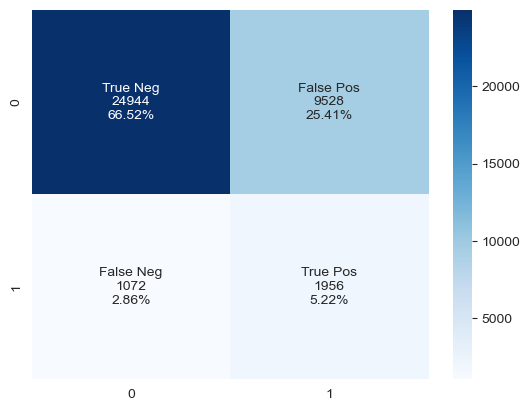

In [108]:
params = {"random_state": 42, "class_weight":"balanced", 'n_estimators': 394, 'max_depth': 38, 'learning_rate': 0.027844601049330182}

results.loc[len(results)] = ml_run(LGBMClassifier(), params, "LGBM_classifier_opti_class_weight", X_train, X_test, name_pipeline="LGBM_classifier_opti_class_weight", balancing_method="balanced_class_weight" )

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.958     0.683     0.660     0.798     0.672     0.452    103415
   Positive      0.155     0.660     0.683     0.251     0.672     0.450      9085

avg / total      0.893     0.682     0.662     0.754     0.672     0.452    112500

Roc-Auc TRAIN Score:  0.734
F_beta TRAIN Score:  0.662
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.957     0.681     0.656     0.796     0.668     0.448     34472
   Positive      0.153     0.656     0.681     0.248     0.668     0.445      3028

avg / total      0.893     0.679     0.658     0.752     0.668     0.448     37500

Roc-Auc TEST Score:  0.732
F_beta TEST Score:  0.659
Total seconds:  0.099576


('LR_GS',
 'None',
 'None',
 0.7335070735590374,
 0.7316564696851203,
 0.6590401890481525,
 0.6789066666666667,
 26.019257)

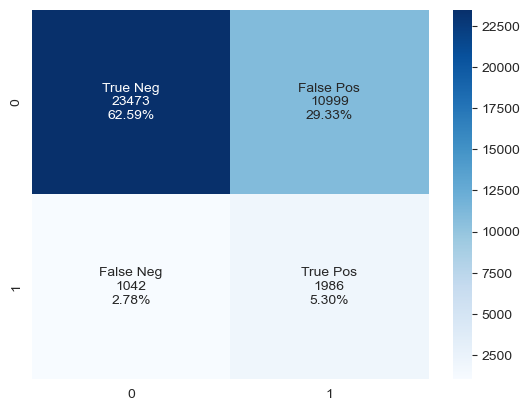

In [97]:
# Run the MLflow experiments
ml_run(gs_lr, params, "LR_GS", X_train, X_test, name_pipeline="LR_GS", balancing_method="None", sampling_method=None)

For training set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.920     0.999     0.015     0.958     0.122     0.016      6892
   Positive      0.692     0.015     0.999     0.029     0.122     0.013       608

avg / total      0.902     0.920     0.095     0.883     0.122     0.016      7500

Roc-Auc TRAIN Score:  0.798
F_beta TRAIN Score:  0.699
For test set: 

                   pre       rec       spe        f1       geo       iba       sup

   Negative      0.919     0.999     0.005     0.957     0.070     0.005      2298
   Positive      0.250     0.005     0.999     0.010     0.070     0.004       202

avg / total      0.865     0.918     0.085     0.881     0.070     0.005      2500

Roc-Auc TEST Score:  0.756
F_beta TEST Score:  0.544
Total seconds:  1.286292


('LR_balanced_GS',
 'balanced_class_weight',
 'None',
 0.7980417322143142,
 0.7556377047626434,
 0.5439839871905121,
 0.9184,
 35.847277)

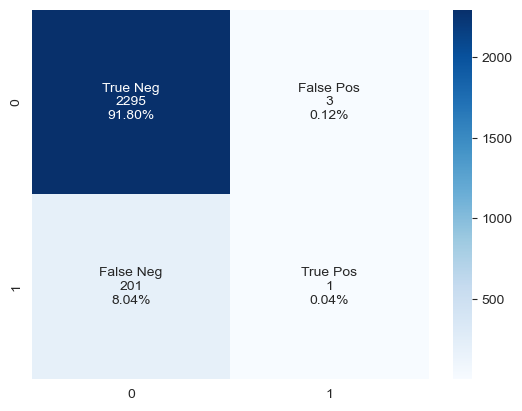

In [72]:
ml_run(gs_lr_balanced, params_lr, "LR_balanced_GS", X_train, X_test, name_pipeline="LR_balanced_GS", balancing_method="balanced_class_weight", sampling_method=None)

# Results <a class="anchor" id='chapter4'></a>

In [115]:
sorted_results = results.sort_values(by='F_beta_test', ascending=False)
sorted_results

,Model,Balancing_method,Sampling_method,AUC,AUC_test,F_beta_test,Accuracy_test,Time
27,LGBM_classifier_class_weight,balanced_class_weight,None,0.816627,0.753027,0.679322,0.717893,0.987991
35,LGBM_classifier_opti_class_weight,balanced_class_weight,None,0.820756,0.752446,0.676977,0.717333,2.355122
31,LGBM_balanced_GS,class_weight,None,0.799204,0.750760,0.676666,0.710320,2479.106203
11,CatBoostClassifier_UnderSampling,Under_sampler,RandomUnderSampler(),0.813767,0.749210,0.672447,0.690880,4.762015
2,LGBMClassifier_UnderSampling,Under_sampler,RandomUnderSampler(),0.803053,0.743411,0.671883,0.691147,0.618529
17,XGBClassifier_UnderSampling,Under_sampler,RandomUnderSampler(),0.846040,0.735241,0.665340,0.672213,1.166155
18,XGBClassifier_UnderSampling,Under_sampler,RandomUnderSampler(),0.840710,0.731731,0.662252,0.676773,1.080523
39,LR_SMOTE,SMOTE,SMOTE(),0.732659,0.730024,0.660166,0.680107,2.132327
26,LR_balanced,balanced_class_weight,None,0.733478,0.731684,0.659508,0.679467,1.055339
37,LR_balanced,balanced_class_weight,None,0.733478,0.731684,0.659508,0.679467,1.147166


# Feature Importance <a class="anchor" id='chapter5'></a>

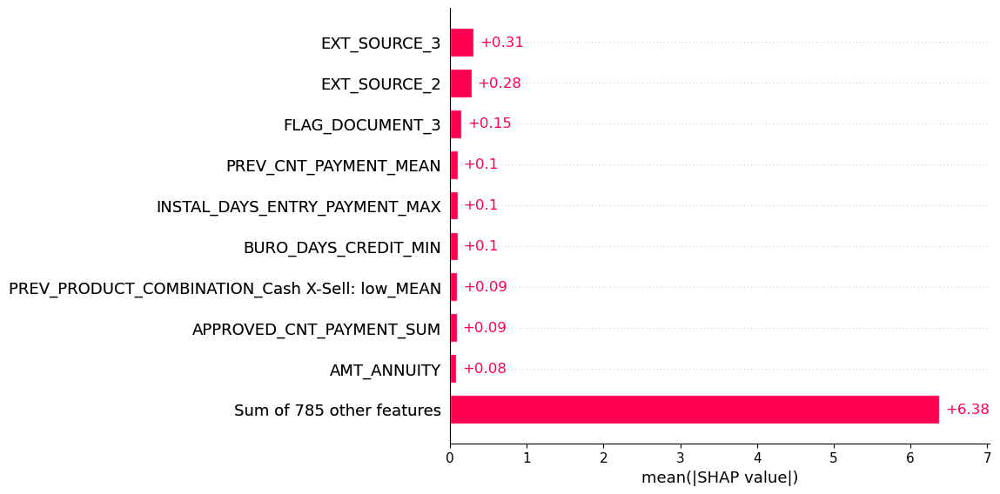

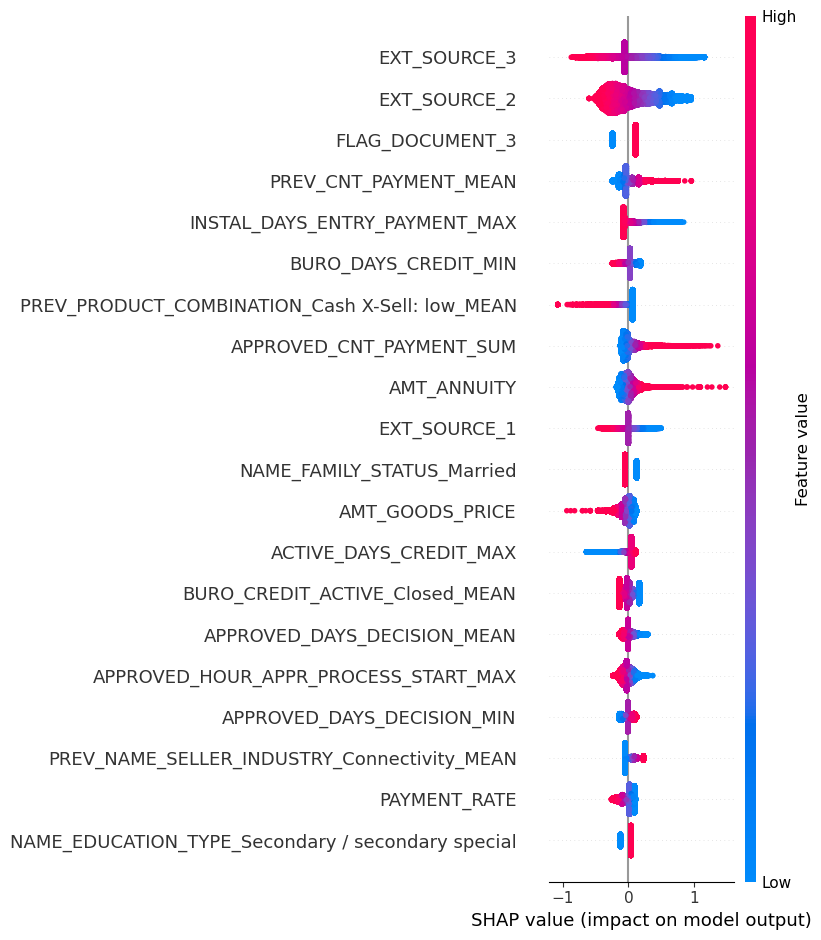

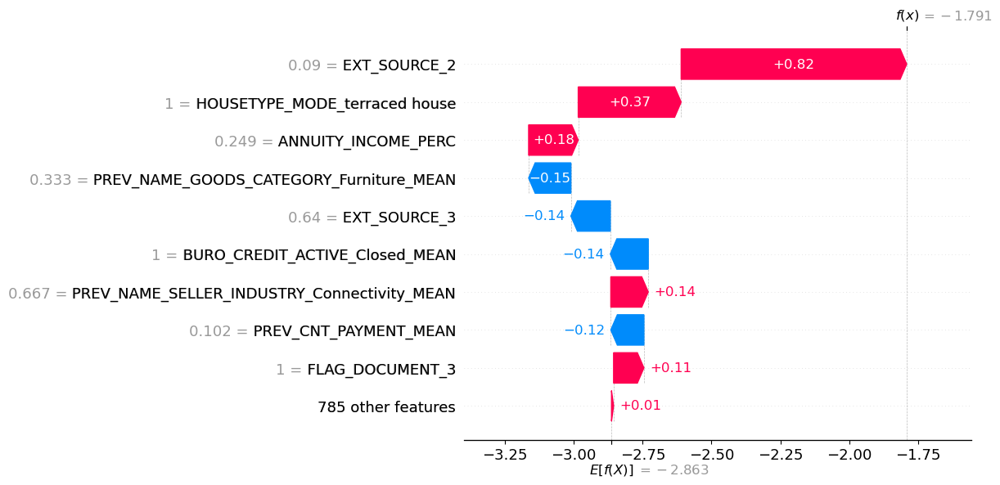

In [68]:
shap_values = plot_shap_values(X_train,y_train, input_id = 119153)

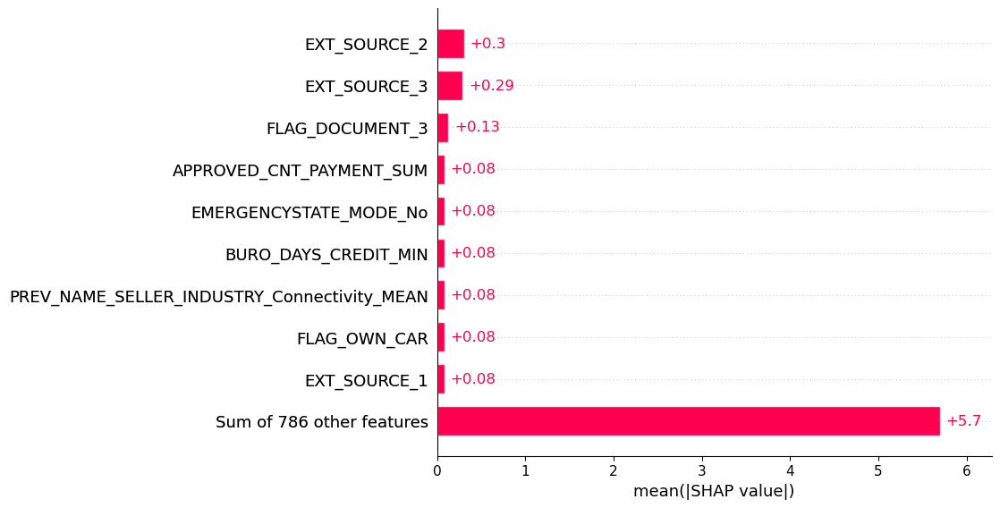

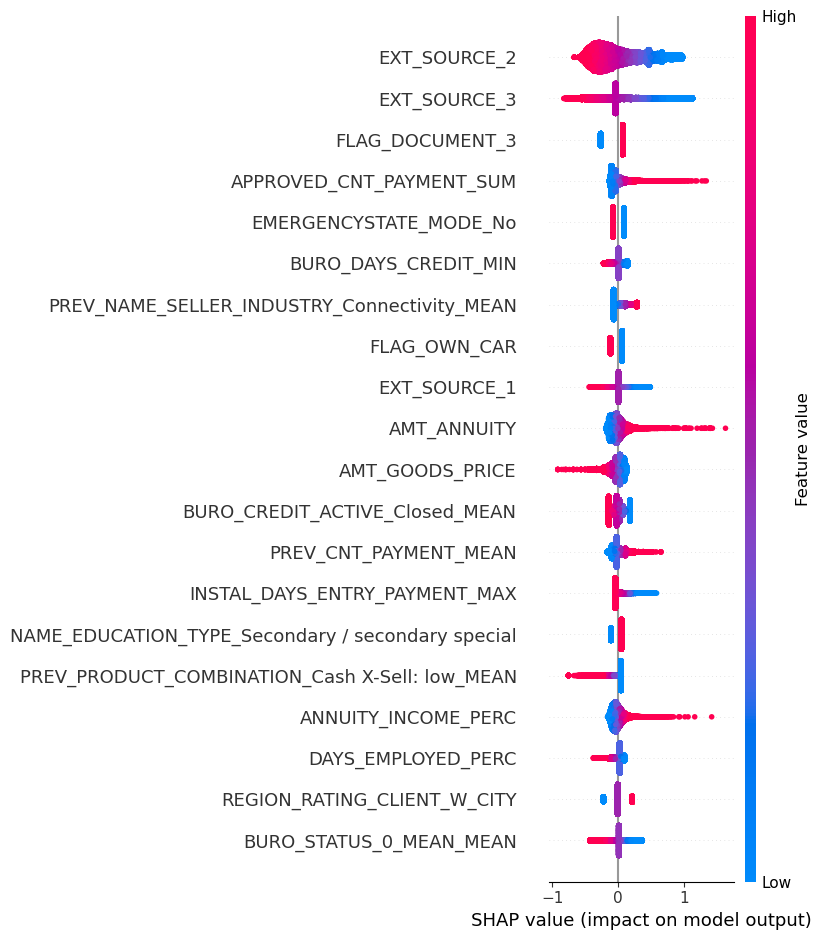

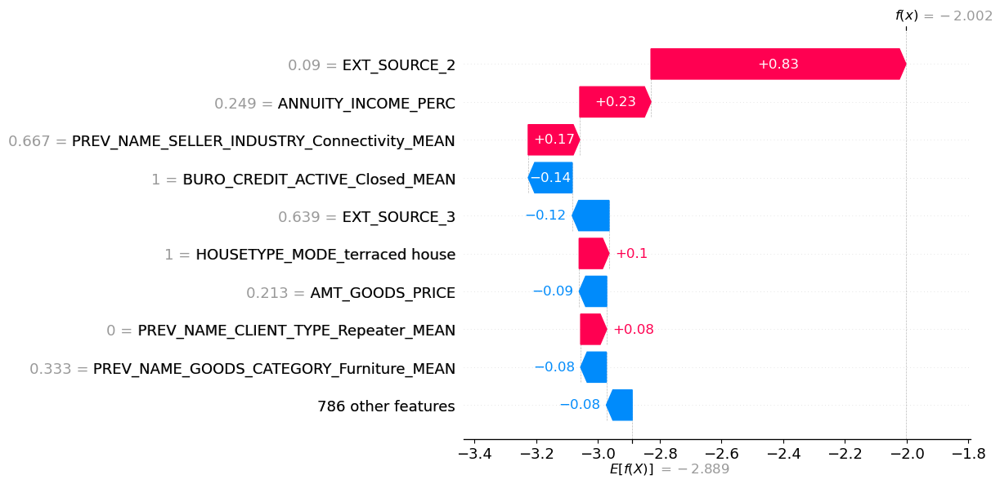

In [78]:
shap_values = plot_shap_values(X_train,y_train, input_id = 119153)

In [ ]:
vals= np.abs(shap_values.values).mean(0)
feature_importance = pd.DataFrame(list(zip(X_train.columns,vals)),columns=['col_name','feature_importance_vals'])
feature_importance.sort_values(by=['feature_importance_vals'],ascending=False,inplace=True)
feature_importance.head(50)

,col_name,feature_importance_vals
30,EXT_SOURCE_2,0.302909
31,EXT_SOURCE_3,0.290886
81,FLAG_DOCUMENT_3,0.126355
578,APPROVED_CNT_PAYMENT_SUM,0.083328
237,EMERGENCYSTATE_MODE_No,0.082731
244,BURO_DAYS_CREDIT_MIN,0.082588
515,PREV_NAME_SELLER_INDUSTRY_Connectivity_MEAN,0.081567
0,FLAG_OWN_CAR,0.080180
29,EXT_SOURCE_1,0.079698
5,AMT_ANNUITY,0.079695


In [10]:
#Creating a list of interpretable variable to be tested in a new model
features_list = ['EXT_SOURCE_2','EXT_SOURCE_3','EXT_SOURCE_1','FLAG_OWN_CAR','AMT_ANNUITY','AMT_GOODS_PRICE','NAME_EDUCATION_TYPE_Secondary / secondary special',
                 'ANNUITY_INCOME_PERC','DAYS_EMPLOYED_PERC','NAME_FAMILY_STATUS_Married','DAYS_BIRTH','PAYMENT_RATE','OCCUPATION_TYPE_Laborers','FLAG_DOCUMENT_3']

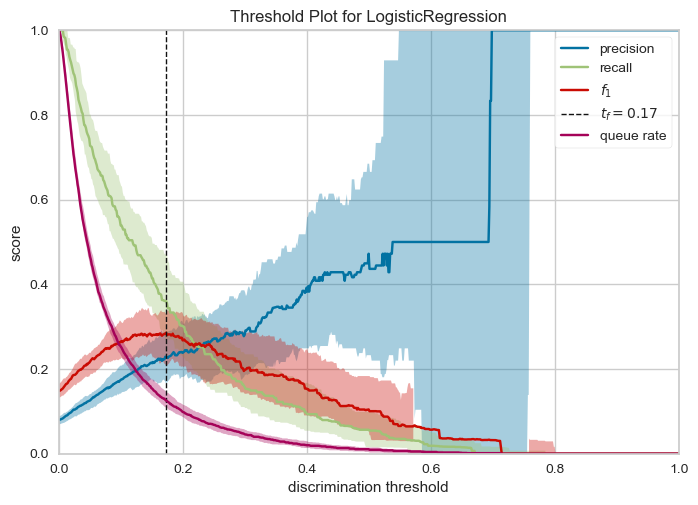

YellowbrickAttributeError: neither visualizer 'DiscriminationThreshold' nor wrapped estimator 'LogisticRegression' have attribute 'force_model'

YellowbrickAttributeError: neither visualizer 'DiscriminationThreshold' nor wrapped estimator 'LogisticRegression' have attribute 'force_model'

YellowbrickAttributeError: neither visualizer 'DiscriminationThreshold' nor wrapped estimator 'LogisticRegression' have attribute 'force_model'

In [54]:
discrimination_threshold(LGBMClassifier(class_weight="balanced"),X_train,y_train, fbeta = 10)

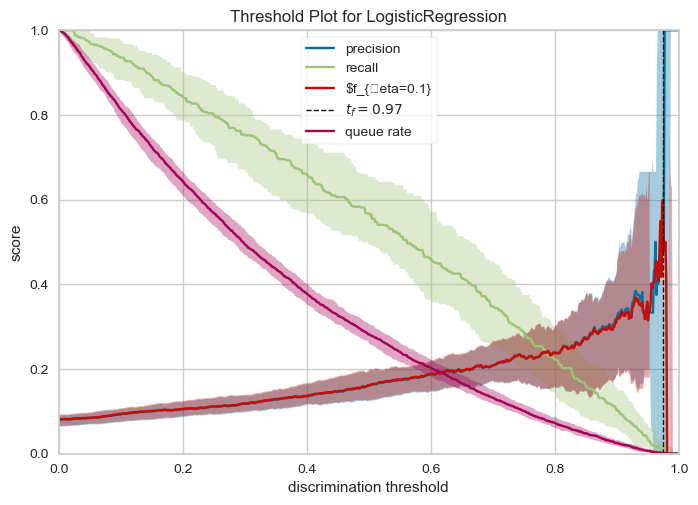

YellowbrickAttributeError: neither visualizer 'DiscriminationThreshold' nor wrapped estimator 'LogisticRegression' have attribute 'force_model'

YellowbrickAttributeError: neither visualizer 'DiscriminationThreshold' nor wrapped estimator 'LogisticRegression' have attribute 'force_model'

YellowbrickAttributeError: neither visualizer 'DiscriminationThreshold' nor wrapped estimator 'LogisticRegression' have attribute 'force_model'

In [57]:
discrimination_threshold(LogisticRegression(class_weight='balanced'),X_train,y_train, fbeta = 10)

# Analyse du data drift <a class="anchor" id='chapter6'></a>

In [31]:
cur = df_data_drift.drop(columns = ['CODE_GENDER','SK_ID_CURR'])
ref = df.drop(columns = ['CODE_GENDER','SK_ID_CURR','TARGET'])

In [39]:
common_columns = list(set(cur.columns).intersection(ref.columns))

# Create new datasets with common columns
new_cur = cur[common_columns].copy()
new_ref = ref[common_columns].copy()

In [ ]:
data_drift_dataset_report = Report(metrics=[

    DatasetDriftMetric(),

    DataDriftTable(),    

])

data_drift_dataset_report.run(reference_data=new_ref, current_data=new_cur)

data_drift_dataset_report.show(mode='inline')

In [ ]:
# Create an anomalous flag column
df['DAYS_EMPLOYED_ANOM'] = df["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
df['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

#df = df.drop(columns = ["DAYS_EMPLOYED_ANOM", "CODE_GENDER"])

data_sample = df.sample(150000, random_state=42)
# set the target
y = data_sample['TARGET']

# set features
sk_id_curr = data_sample['SK_ID_CURR']
X = data_sample[[f for f in df.columns if f not in ["TARGET", "SK_ID_CURR"]]]

#Cleaning the inf values generated with the encoding
X.replace([np.inf, -np.inf], np.nan, inplace=True)

X_df = pd.DataFrame(X, index=X.index, columns=X.columns)
X_df['SK_ID_CURR'] = sk_id_curr

imputer = SimpleImputer(missing_values=np.nan, strategy="median")
X_imputed = imputer.fit_transform(X)

scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X_imputed)

X_scaled_df = pd.DataFrame(X_scaled, index=X.index, columns=X.columns)

X_scaled_df.columns = [col.replace(" ", "_").replace("#", "") for col in X_scaled_df.columns]

#Creating a list of interpretable variable to be tested in a new model
features_list = ['EXT_SOURCE_2','EXT_SOURCE_3','EXT_SOURCE_1','FLAG_OWN_CAR','AMT_ANNUITY','AMT_GOODS_PRICE','NAME_EDUCATION_TYPE_Secondary_/_secondary_special',
                 'ANNUITY_INCOME_PERC','DAYS_EMPLOYED_PERC','NAME_FAMILY_STATUS_Married','DAYS_BIRTH','PAYMENT_RATE','OCCUPATION_TYPE_Laborers','FLAG_DOCUMENT_3']

X_train, X_test, y_train, y_test = train_test_split(X_scaled_df[features_list], y, stratify=y, random_state=42)